# -------------------------------------------------------------
#  0.  Importy
# -------------------------------------------------------------

In [17]:
from __future__ import annotations
from typing import Tuple, Any
from itertools import combinations
import cv2 as cv
import numpy as np
import os
import matplotlib.pyplot as plt
import shutil
import seaborn as sns


# -------------------------------------------------------------
#  1.  Przetwarzanie wstępne / konwersje
# -------------------------------------------------------------

In [2]:
# CLAHE do wzmocnienia kontrastu – poprawia krawędź tęczówki, ale delikatnie.
_CLAHE = cv.createCLAHE(clipLimit=4.0, tileGridSize=(8, 8))

def to_gray(img_bgr: np.ndarray, equalize: bool = False) -> np.ndarray:
    gray = cv.cvtColor(img_bgr, cv.COLOR_BGR2GRAY)
    if equalize:
        gray = _CLAHE.apply(gray)
    return gray


# -------------------------------------------------------------
#  2.  Maska największej składowej
# -------------------------------------------------------------

In [3]:
def largest_component(mask_bin: np.ndarray) -> np.ndarray:
    num, labels, stats, _ = cv.connectedComponentsWithStats(mask_bin, connectivity=8)
    if num <= 1:  # tylko tło
        return np.zeros_like(mask_bin)
    # Indeks największego pola (1..N‑1)
    areas = stats[1:, cv.CC_STAT_AREA]
    idx = 1 + int(np.argmax(areas))
    return np.where(labels == idx, 255, 0).astype(np.uint8)

# -------------------------------------------------------------
#  3.  Detekcja źrenicy
# -------------------------------------------------------------

In [4]:
def detect_pupil(
    img_path: str,
    gray: np.ndarray,
    X_P: float       = 4.5,
    kernel_size: int = 5,
    morph_iter: int  = 1,
    debug: bool      = False,
    output_dir: str  = "debug_outputs"
) -> Tuple[Tuple[int, int], int, np.ndarray]:
    """
    Zwraca:
      - center (cy, cx)
      - radius r
      - pupil_mask jako maska 0/255
    Proces:
      0) CLAHE → GaussianBlur
      1) Progowanie globalne
      2) Erozja i dylatacja dla usunięcia drobnych artefaktów
      3) Morfologia: closing (wypełnienie dziur) oraz opening (usunięcie szumu)
      4) Flood fill wypełniający większe dziury
      5) Największy komponent jako źrenica
      6) Projekcje i obliczenie środka oraz promienia
    """
    os.makedirs(output_dir, exist_ok=True)
    base = os.path.splitext(os.path.basename(img_path))[0]
    
    img_bgr = cv.imread(img_path)
    if img_bgr is None:
        raise FileNotFoundError(f"Nie mogę wczytać: {img_path}")

    # 0) Enhance contrast + Blur
    clahe = cv.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    enhanced = clahe.apply(gray)
    blurred = cv.GaussianBlur(enhanced, (kernel_size,)*2, 0)

    # 1) Globalny próg
    P = blurred.mean()
    T = P / X_P
    _, bin_img = cv.threshold(blurred, T, 255, cv.THRESH_BINARY_INV)

    # 2) Erozja i dylatacja
    pupil = largest_component(bin_img)
    kern_ed = cv.getStructuringElement(cv.MORPH_ELLIPSE, (kernel_size,)*2)
    dilated = cv.dilate(pupil, kern_ed, iterations=3)
    eroded = cv.erode(dilated, kern_ed, iterations=1)

    # 3) Morfologia: zamknięcie i otwarcie
    kern_close = cv.getStructuringElement(cv.MORPH_ELLIPSE, (5,)*2)
    kern_open = cv.getStructuringElement(cv.MORPH_ELLIPSE, (9,)*2)
    opened = cv.morphologyEx(dilated, cv.MORPH_OPEN, kern_open, iterations=morph_iter)
    closed = cv.morphologyEx(opened, cv.MORPH_CLOSE, kern_close, iterations=morph_iter)
    
    # 4) Flood fill
    h, w = closed.shape
    flood = closed.copy()
    mask = np.zeros((h+2, w+2), np.uint8)
    cv.floodFill(flood, mask, (0,0), 255)
    inv = cv.bitwise_not(flood)
    filled = closed | inv

    # 5) Największy spójny obszar
    pupil = largest_component(filled)

    # 6) Projekcje i centrum
    mask_bin = (pupil > 0).astype(np.uint8)
    row_proj = np.sum(mask_bin, axis=1)
    col_proj = np.sum(mask_bin, axis=0)
    max_row = row_proj.max()
    max_col = col_proj.max()
    rows = np.where(row_proj == max_row)[0]
    cols = np.where(col_proj == max_col)[0]
    cy = int(np.median(rows))
    cx = int(np.median(cols))

    # 7) Promień
    ys, xs = np.nonzero(mask_bin)
    if ys.size == 0:
        raise RuntimeError("Nie wykryto źrenicy")
    distances = np.sqrt((ys - cy)**2 + (xs - cx)**2)
    r = int(np.mean(distances))

    # Debug: wizualizacja etapów
    if debug:
        stages = {
            "Gray":           gray,
            "Gray_CLAHE":     enhanced,
            "Blur":           blurred,
            "Threshold":      bin_img,
            "Erode":          eroded,
            "Dilate":         dilated,
            "Close":          closed,
            "Open":           opened,
            "Floodfill":      filled,
            "FinalMask":      pupil
        }
        for title, img_stage in stages.items():
            fn = f"{base}_{title}.png"
            outp = os.path.join(output_dir, fn)
            if img_stage.ndim == 2:
                cv.imwrite(outp, img_stage)
            else:
                cv.imwrite(outp, cv.cvtColor(img_stage, cv.COLOR_BGR2RGB))
        fig2, ax = plt.subplots(1, 1, figsize=(6,4))
        ax.imshow(gray,cmap='gray')
        ax.set_title('Gray')
        ax.axis('off')
        fig, axes = plt.subplots(3, 3, figsize=(16, 12))
        axes = axes.ravel()
        titles = ['Gray (CLAHE)', 'Blur', 'Threshold', 'Erode', 'Dilate', 'Close', 'Open', 'Floodfill', 'Final Mask']
        imgs = [enhanced, blurred, bin_img, eroded, dilated, closed, opened, filled, pupil]
        for i, (img_plot, t) in enumerate(zip(imgs, titles)):
            axes[i].imshow(img_plot, cmap='gray'); axes[i].set_title(t); axes[i].axis('off')
        # Projekcje
        fig2, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,4))
        ax1.plot(row_proj, np.arange(len(row_proj))); ax1.axhline(cy, color='r'); ax1.set_title('Row Projection')
        ax2.plot(np.arange(len(col_proj)), col_proj); ax2.axvline(cx, color='r'); ax2.set_title('Col Projection')
        plt.tight_layout(); plt.show()

    return (cy, cx), r+5, pupil

# -------------------------------------------------------------
#  4.  Detekcja zewnętrznej granicy tęczówki
# -------------------------------------------------------------

In [5]:
def detect_iris(
    img_path: str,
    gray: np.ndarray,
    center: Tuple[int,int],
    r_pupil: int,
    X_I: float       = 1.5,
    kernel_size: int = 7,
    morph_iter: int  = 2,
    alpha: float     = 0.9,
    debug: bool      = False,
    output_dir: str  = "iris_debug"
) -> Tuple[int, np.ndarray]:
    """
    1) Blur
    2) Globalny próg odwrócony (THRESH_BINARY_INV)
    3) Zamknięcie→Otwarcie→Erozja→Dylatacja
    4) largest_component
    5) boundary = iris_component − eroded(iris_component)
    6) radial histogram tylko z pikseli boundary → r_iris
    7) Końcowa maska: wypełniony dysk
    """
    os.makedirs(output_dir, exist_ok=True)
    base = os.path.splitext(os.path.basename(img_path))[0]

    cy, cx = center
    h, w = gray.shape

    # 1) Blur
    blurred = cv.GaussianBlur(gray, (kernel_size,)*2, 0)

    # 2) Progowanie odwrócone
    P = blurred.mean()
    T = P / X_I
    _, bin_inv = cv.threshold(blurred, T, 255, cv.THRESH_BINARY_INV)

    # 3) Morfologia: zamknięcie→otwarcie→erozja→dylatacja
    kern = cv.getStructuringElement(cv.MORPH_ELLIPSE, (kernel_size,)*2)
    m_close = cv.morphologyEx(bin_inv, cv.MORPH_CLOSE, kern, iterations=morph_iter)
    m_open  = cv.morphologyEx(m_close, cv.MORPH_OPEN,  kern, iterations=morph_iter)
    m_erode = cv.erode(m_open, kern, iterations=1)
    m_dilate= cv.dilate(m_erode, kern, iterations=1)

    # 4) Największy komponent
    iris_comp = largest_component(m_dilate)

    # 5) Wyznacz krawędź maski (morphological gradient)
    k3 = cv.getStructuringElement(cv.MORPH_ELLIPSE, (3,3))
    iris_eroded = cv.erode(iris_comp, k3, iterations=1)
    boundary = cv.subtract(iris_comp, iris_eroded)

    # 6) Radial histogram po boundary
    ys, xs = np.nonzero(boundary)
    dists = np.sqrt((ys - cy)**2 + (xs - cx)**2).astype(int)
    d_min = int(r_pupil * 1.1)
    d_max = min(h, w)//2
    hist = np.bincount(dists, minlength=d_max+1)
    hist_band = hist[d_min:d_max]
    maxv = hist_band.max()
    radii = np.where(hist_band == maxv)[0] + d_min
    r_hist = int(np.median(radii))

    # 6b) Projekcje krawędzi → r_proj
    # poziomo przez środek
    row = boundary[cy, :]
    xs_row = np.where(row > 0)[0]
    if xs_row.size:
        left  = cx - xs_row.min()
        right = xs_row.max() - cx
    else:
        left = right = r_hist

    col    = boundary[:, cx]
    ys_col = np.where(col > 0)[0]
    if ys_col.size:
        up   = cy - ys_col.min()
        down = ys_col.max() - cy
    else:
        up = down = r_hist

    r_proj = int(np.mean([left, right, up, down]))

    r_proj = int(np.mean([left, right, up, down]))

    # 7) Połączenie dwóch pomiarów
    r_comb = int(alpha * r_hist + (1 - alpha) * r_proj)

    # 8) Final mask
    iris_mask = np.zeros_like(gray, dtype=np.uint8)
    cv.circle(iris_mask, (cx, cy), r_comb, 255, thickness=-1)

    # Debug: pokaż wszystkie etapy
    if debug:
            # 3×3 morfologia + comp + boundary + final
            stages = [
                ('Blur',         blurred),
                ('Bin_INV',      bin_inv),
                ('Close',        m_close),
                ('Open',         m_open),
                ('Erode',        m_erode),
                ('Dilate',       m_dilate),
                ('Largest Comp', iris_comp),
                ('Boundary',     boundary),
                ('Final Mask',   iris_mask)
            ]
            for name, img in stages:
                fn = f"{base}_iris_{name}.png"
                path = os.path.join(output_dir, fn)
                cv.imwrite(path, img)
            fig1, ax1 = plt.subplots(3, 3, figsize=(12,12))
            for a, (t, img) in zip(ax1.flatten(), stages):
                a.imshow(img, cmap='gray')
                a.set_title(t)
                a.axis('off')
            plt.tight_layout()
            plt.show()

            # Radial histogram
            fig = plt.figure(figsize=(6,4))
            plt.plot(np.arange(d_min, d_max), hist_band, label='counts')
            plt.axvline(r_hist, color='red', linestyle='--', label=f'r_hist={r_hist}')
            plt.title('Radial Histogram')
            plt.xlabel('radius (px)')
            plt.ylabel('edge-pixel count')
            plt.legend()
            plt.show()
            hist_path = os.path.join(output_dir, f"{base}_iris_radial_hist.png")
            fig.savefig(hist_path)


            # Projections
            fig2, (ax1, ax2) = plt.subplots(1,2, figsize=(12,4))
            ax1.plot(row)
            ax1.axvline(cx-left,  color='green',  linestyle='--', label=f"left={left}")
            ax1.axvline(cx+right, color='purple', linestyle='--', label=f"right={right}")
            ax1.set_title("Horizontal Projection")
            ax1.legend()
            ax2.plot(col)
            ax2.axvline(cy-up,    color='green',  linestyle='--', label=f"up={up}")
            ax2.axvline(cy+down,  color='purple', linestyle='--', label=f"down={down}")
            ax2.set_title("Vertical Projection")
            ax2.legend()
            proj_path = os.path.join(output_dir, f"{base}_iris_projections.png")
            fig2.savefig(proj_path)
            plt.close(fig2)

            print(f"r_hist = {r_hist}, r_proj = {r_proj}, r_comb = {r_comb}")

    return r_comb+2, iris_mask

# -------------------------------------------------------------
#  5.  Rozwinięcie tęczówki do prostokąta
# -------------------------------------------------------------

In [ ]:
def unwrap_iris(
    img_gray: np.ndarray,
    center:    Tuple[int,int],
    r_pupil:   int,
    r_iris:    int,
    radial_res:  int = 64,
    angular_res: int = 128
) -> np.ndarray:
    """
    Daugman rubber‐sheet unwrapping:
    - output shape = (radial_res, angular_res)
    - rows ↔ promień od źrenicy do tęczówki
    - cols ↔ kąt od -90° do +270°
    """
    cy, cx = center
    h, w   = img_gray.shape

    # kąty od -90° do +270°
    theta = np.linspace(-np.pi/2, 3*np.pi/2, angular_res, endpoint=False)
    # normalizowany promień [0,1]
    r_norm = np.linspace(0, 1, radial_res)

    # meshgrid z indexing='ij': 
    #   R[i,j] = r_norm[i],  Θ[i,j] = theta[j]
    R, Θ = np.meshgrid(r_norm, theta, indexing='ij')  

    # skalowanie od r_pupil do r_iris
    radius = r_pupil + R * (r_iris - r_pupil)

    # współrzędne kartezjańskie
    map_x = (cx + radius * np.cos(Θ)).astype(np.float32)
    map_y = (cy + radius * np.sin(Θ)).astype(np.float32)

    # remap – input 2D gray → output [radial_res × angular_res]
    unwrapped = cv.remap(img_gray, map_x, map_y, interpolation=cv.INTER_LINEAR)

    # opcjonalne maskowanie pikseli poza obrazem na czarno
    mask = (
        (map_x >= 0) & (map_x < w) &
        (map_y >= 0) & (map_y < h)
    )
    unwrapped[~mask] = 0

    return unwrapped

# -------------------------------------------------------------
#  6. Przykładowe użycie w detekcji tęczówki i źrenicy
# -------------------------------------------------------------

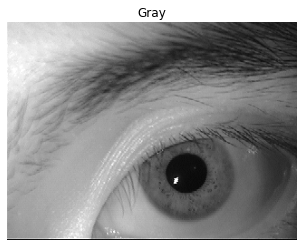

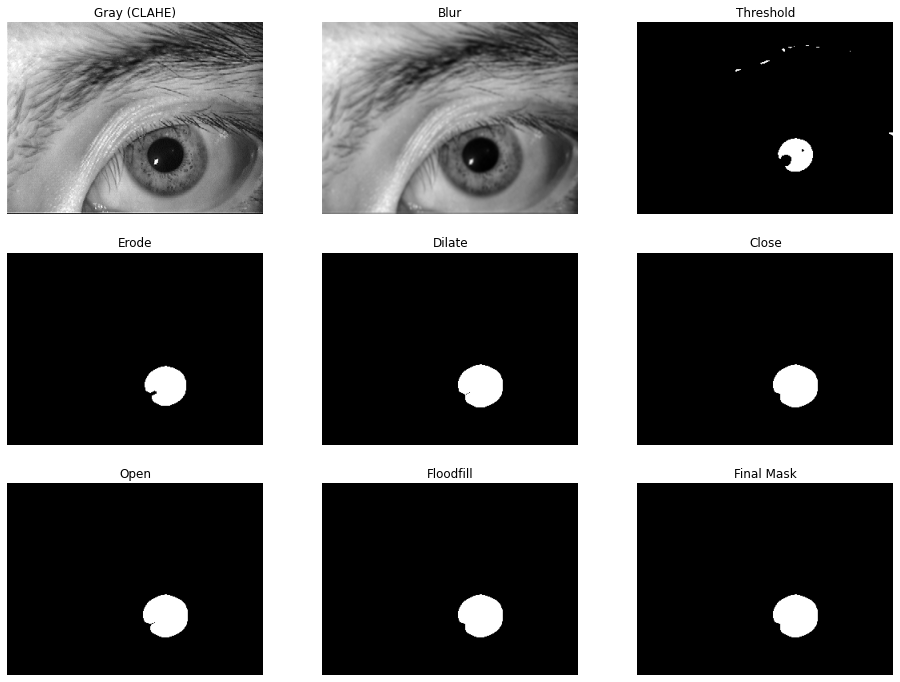

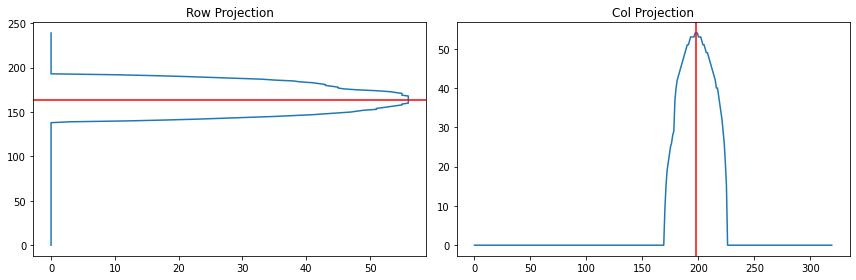

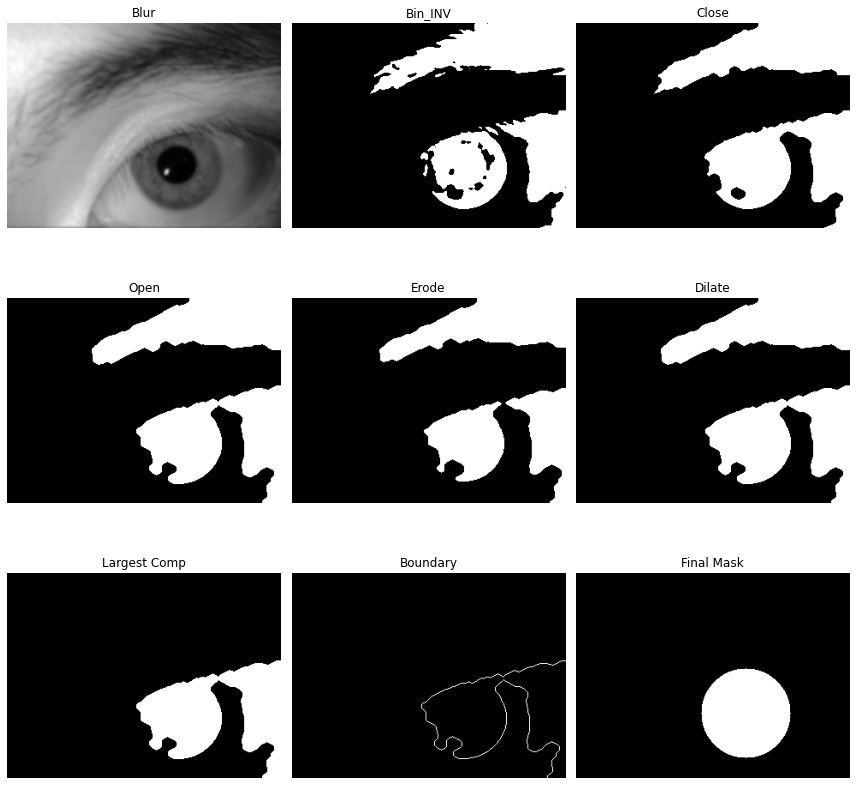

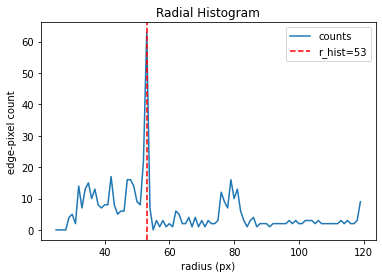

r_hist = 53, r_proj = 52, r_comb = 52


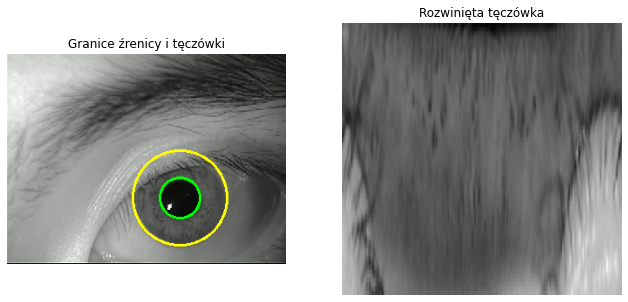

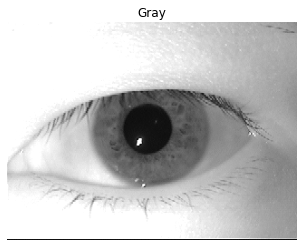

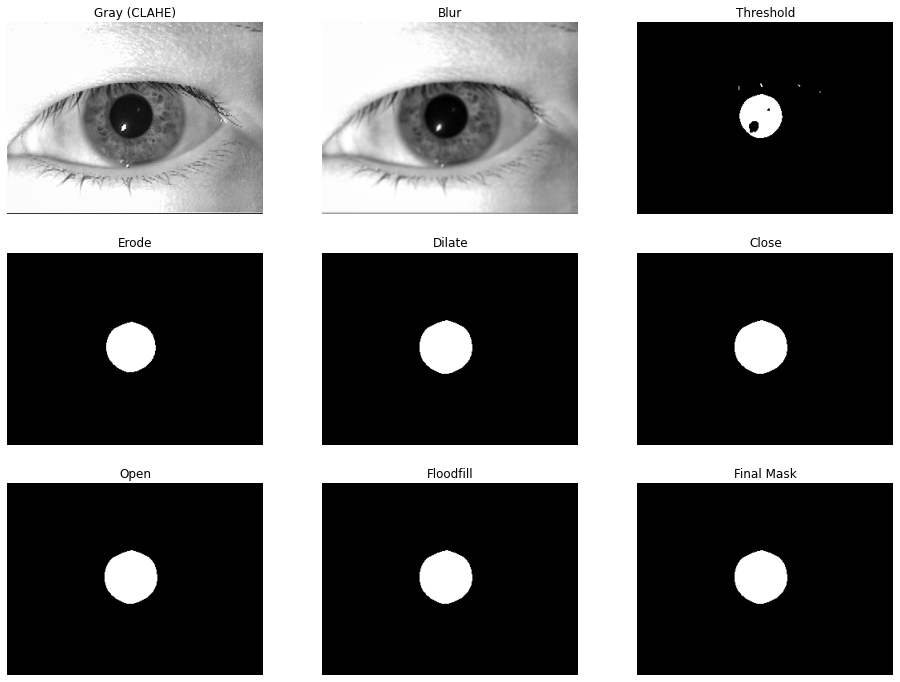

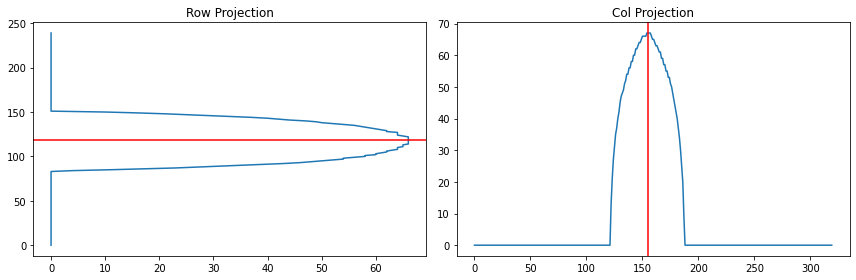

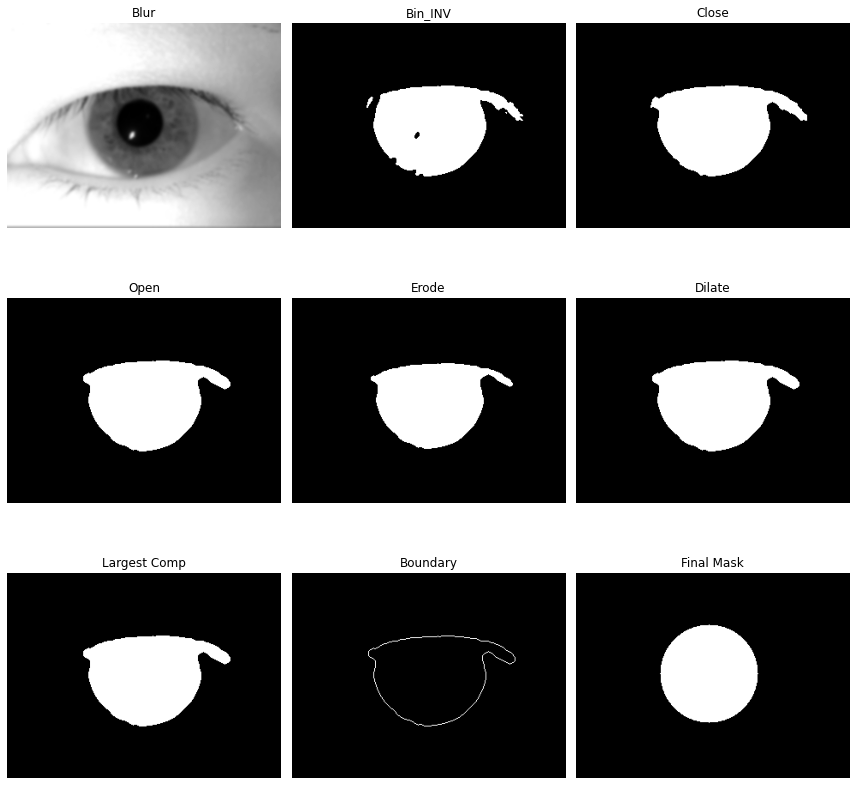

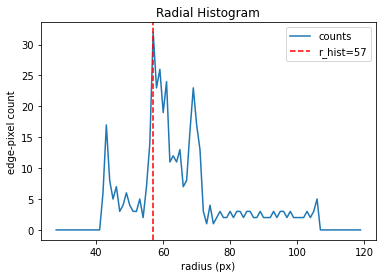

r_hist = 57, r_proj = 58, r_comb = 57


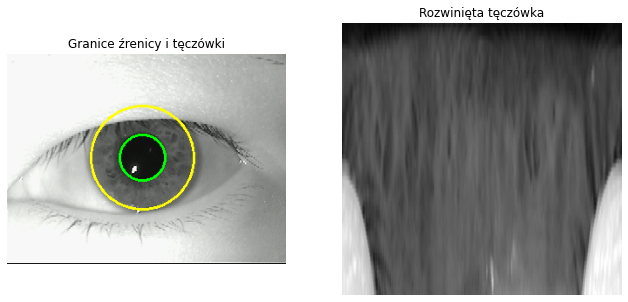

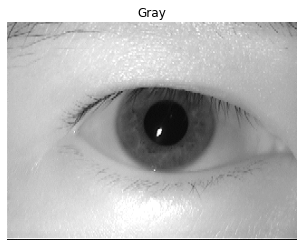

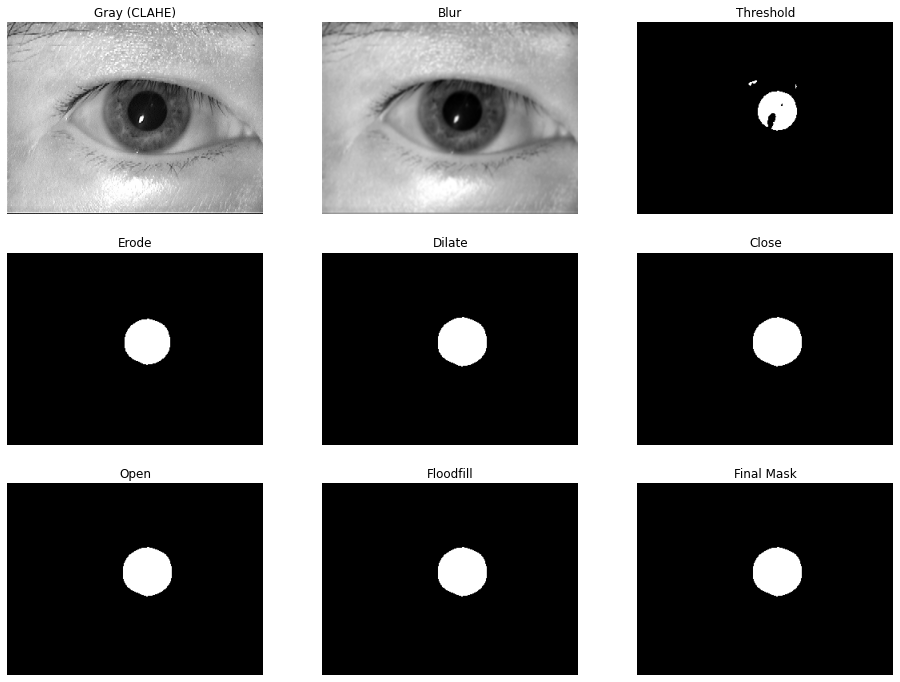

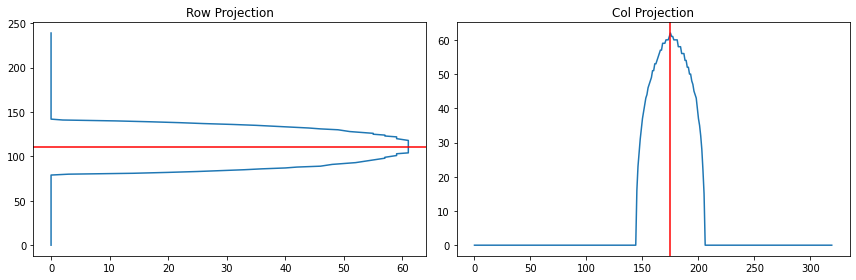

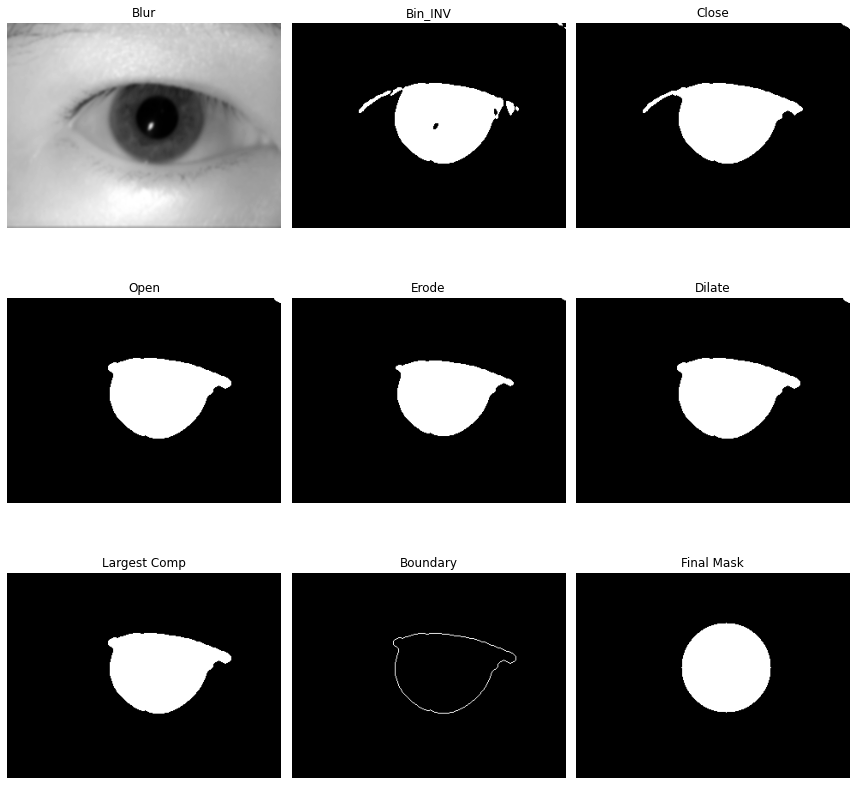

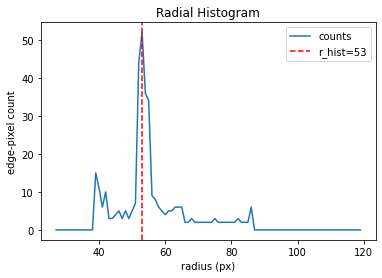

r_hist = 53, r_proj = 52, r_comb = 52


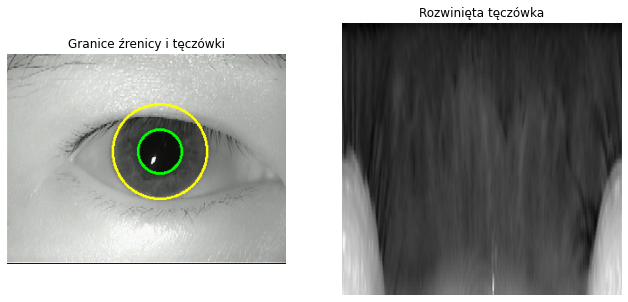

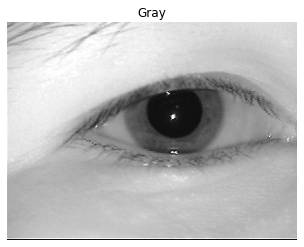

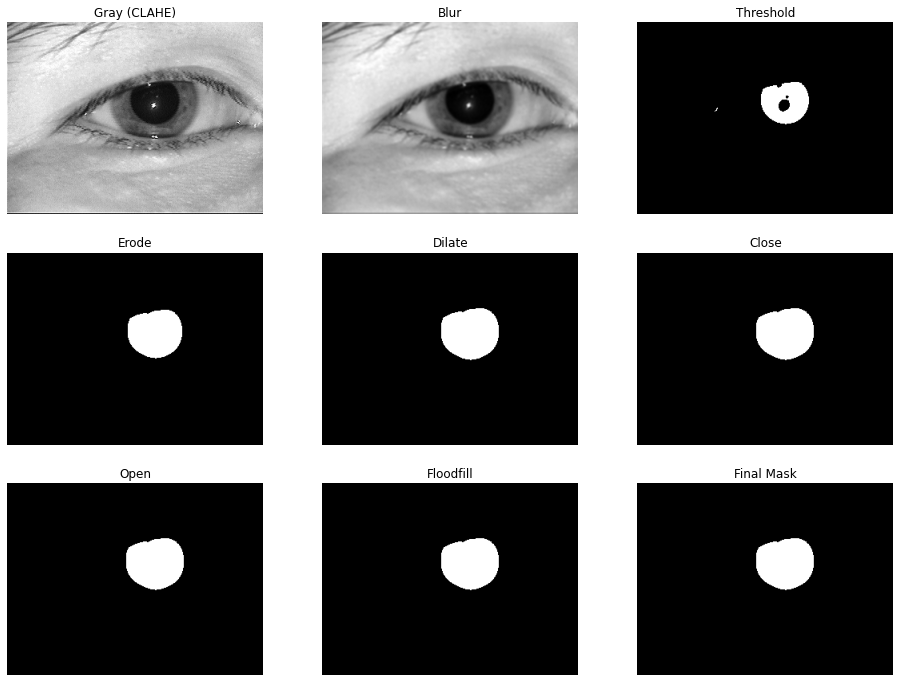

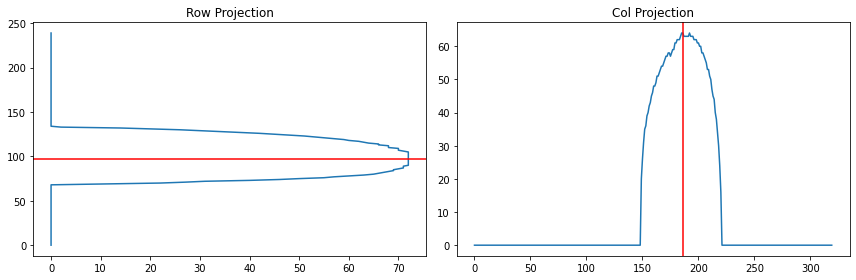

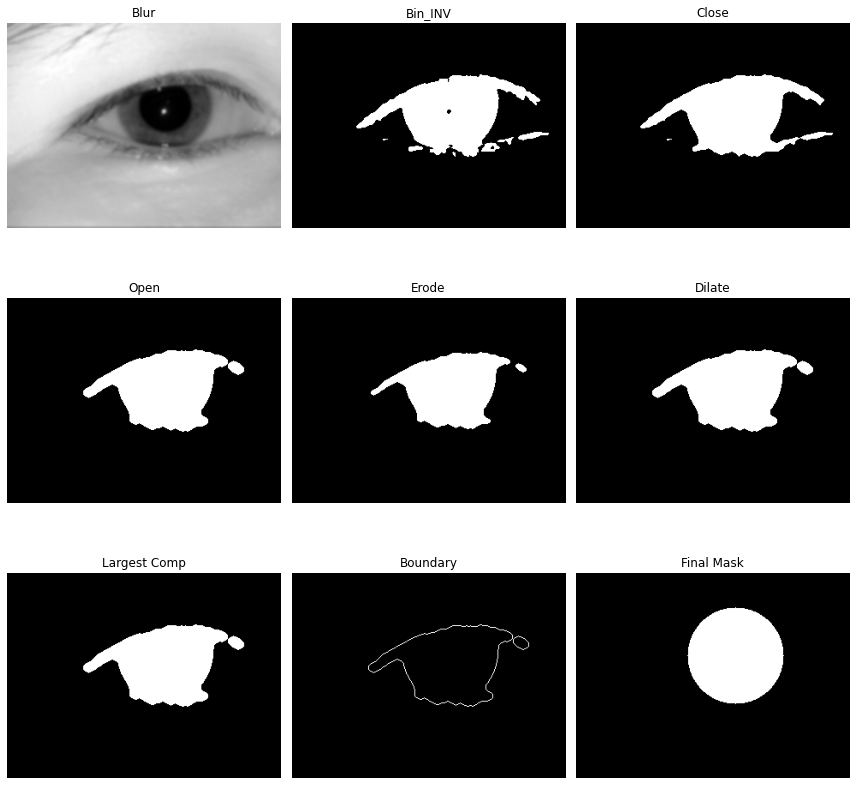

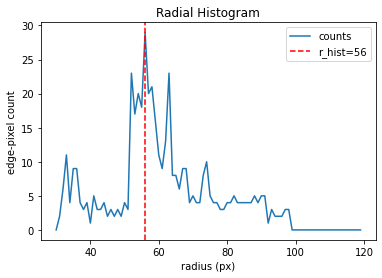

r_hist = 56, r_proj = 56, r_comb = 56


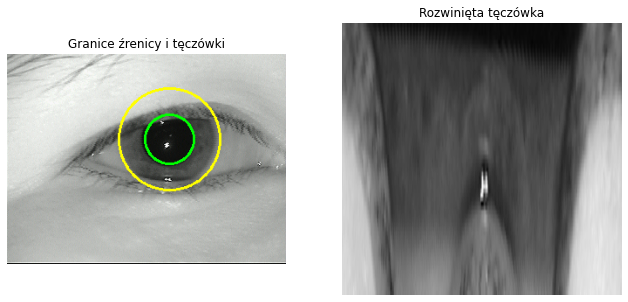

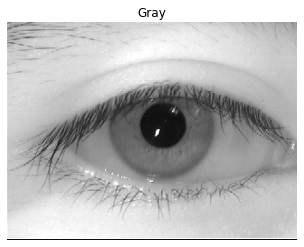

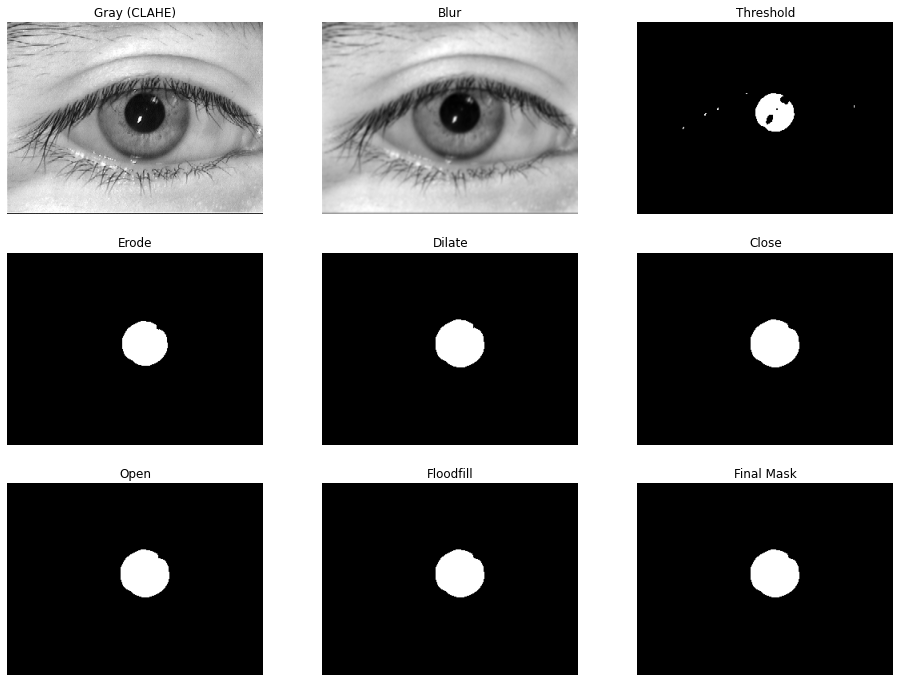

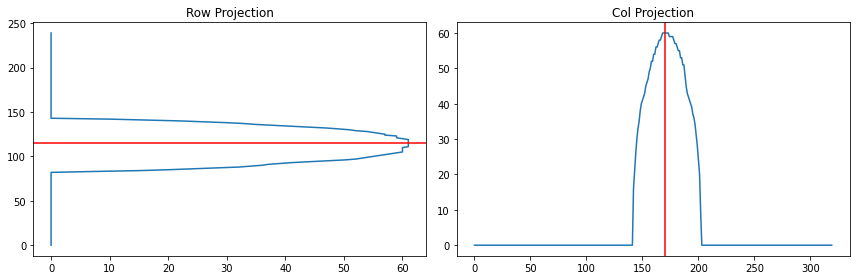

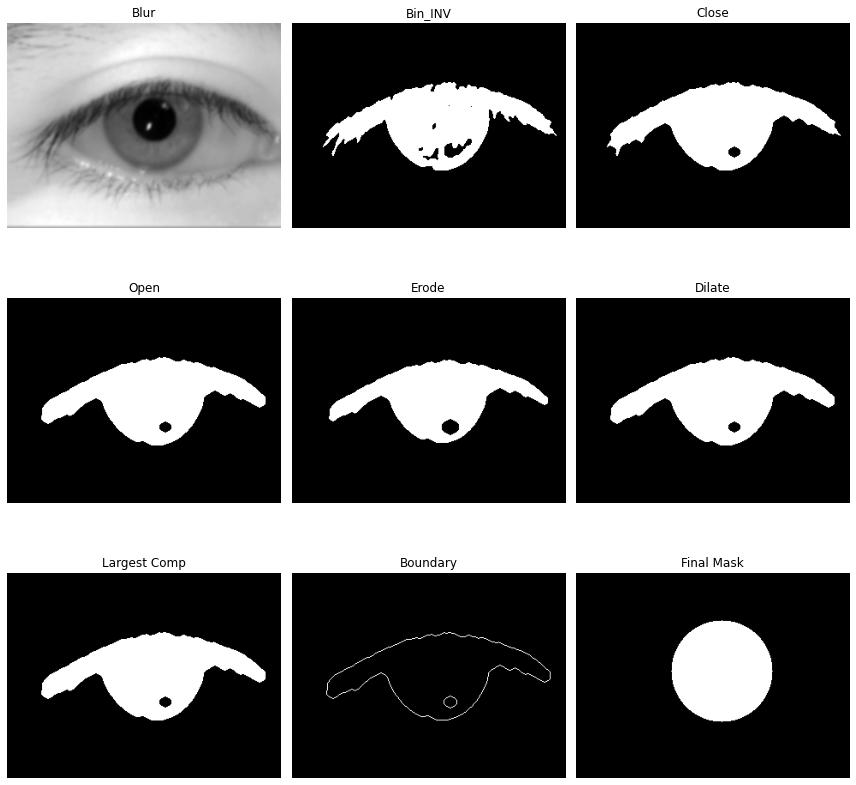

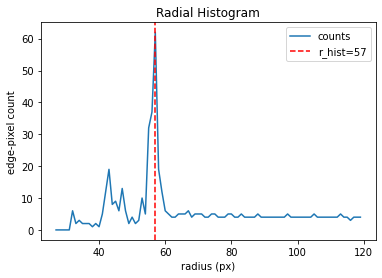

r_hist = 57, r_proj = 85, r_comb = 59


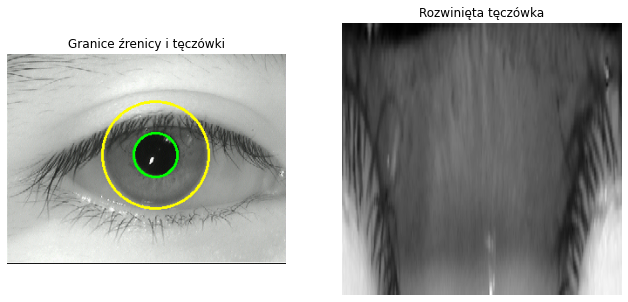

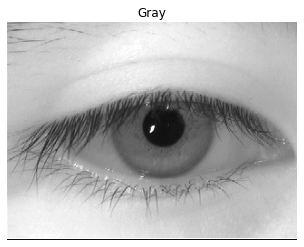

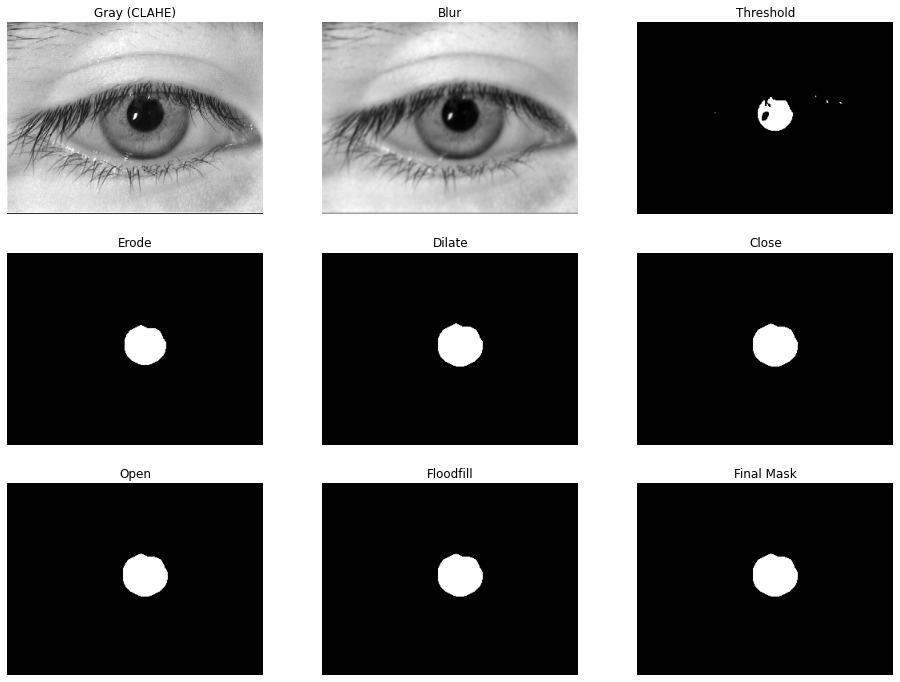

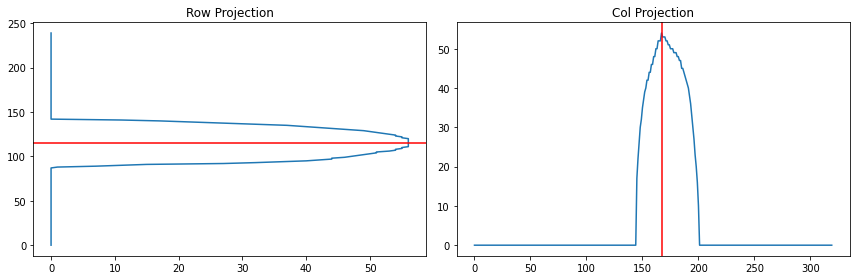

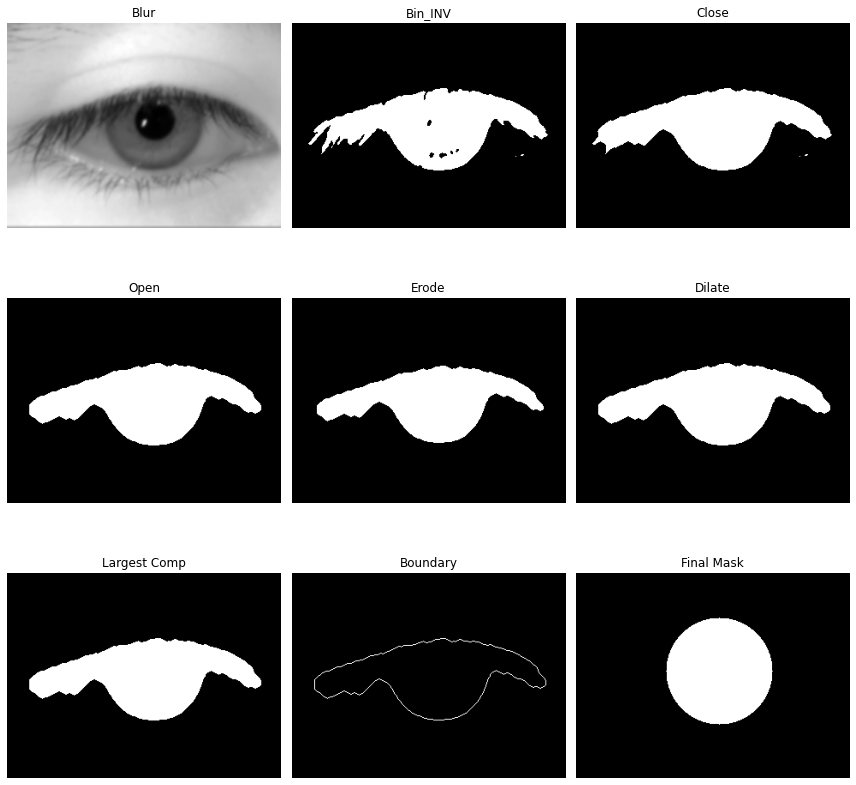

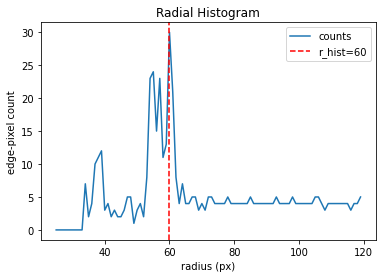

r_hist = 60, r_proj = 85, r_comb = 62


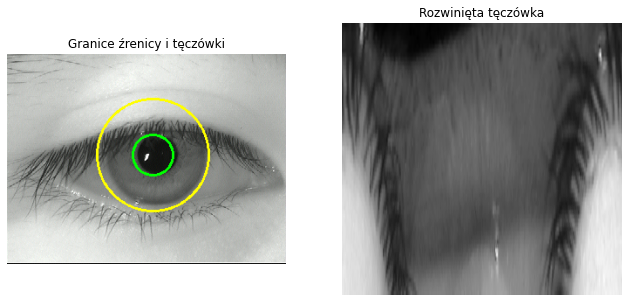

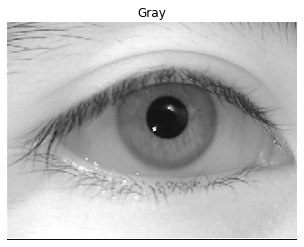

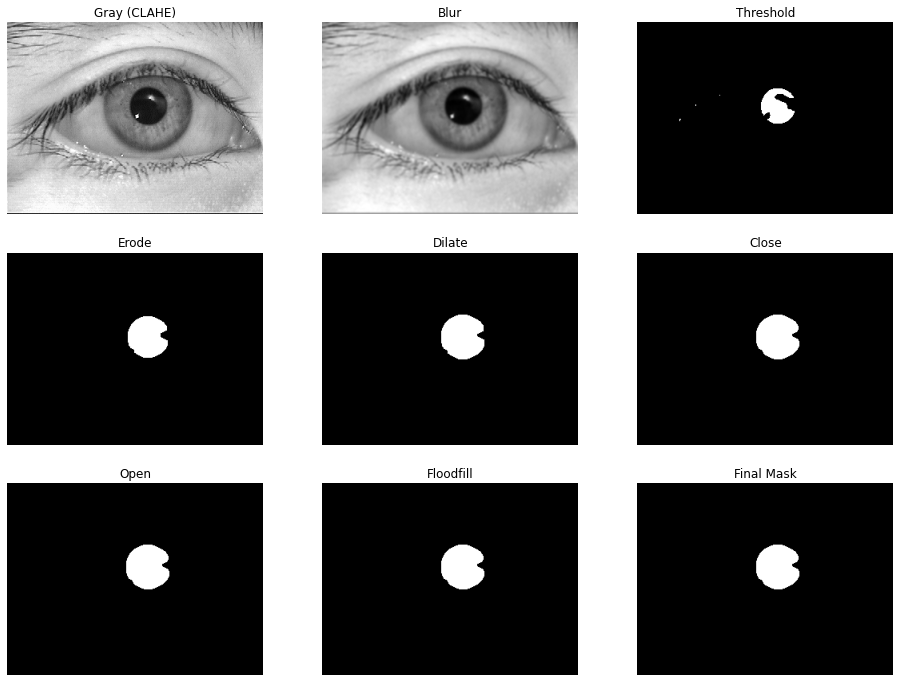

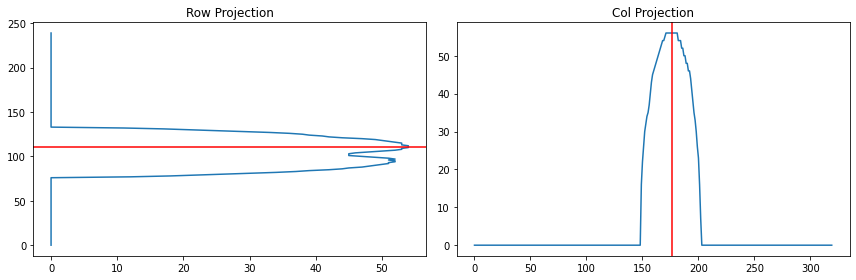

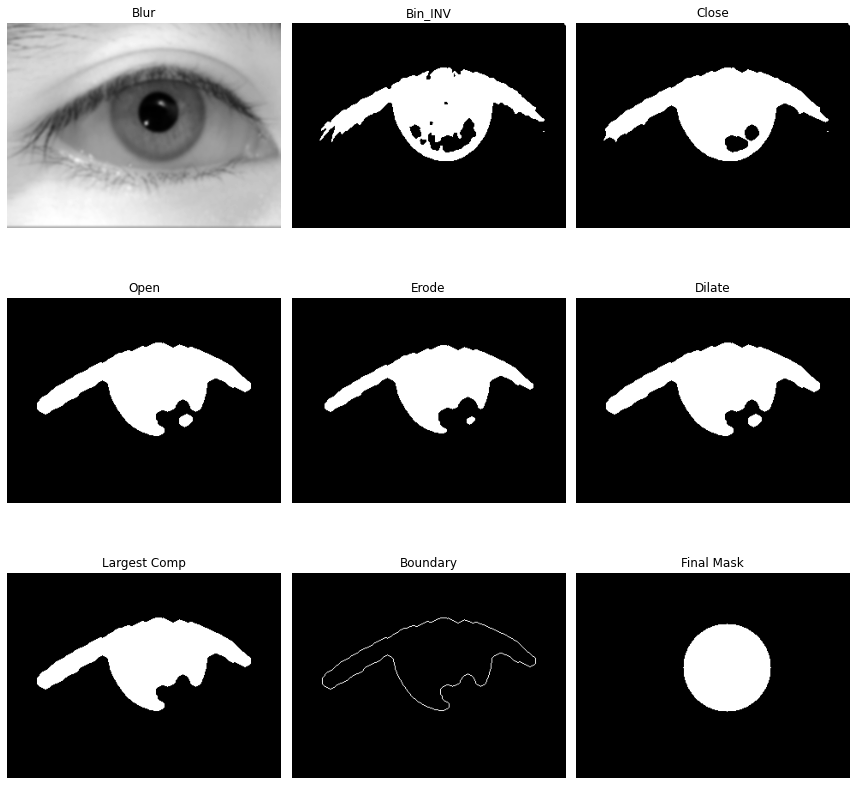

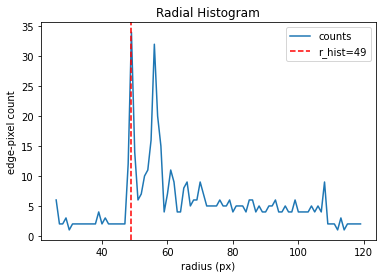

r_hist = 49, r_proj = 72, r_comb = 51


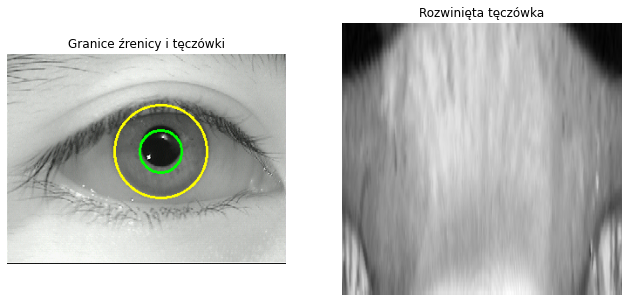

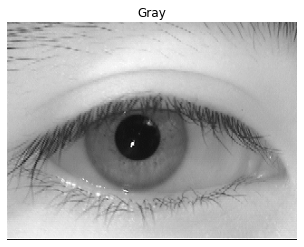

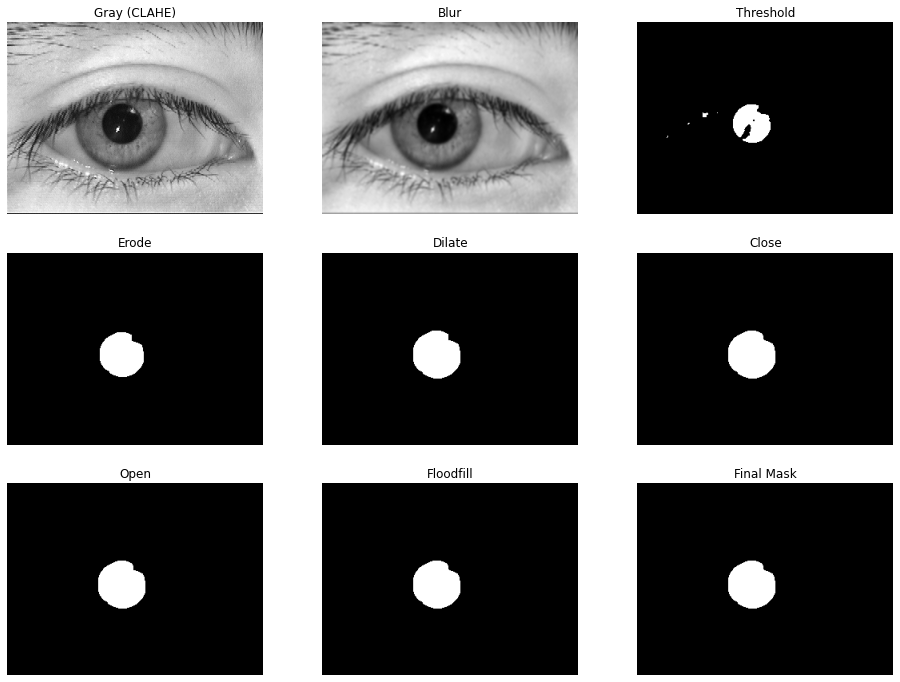

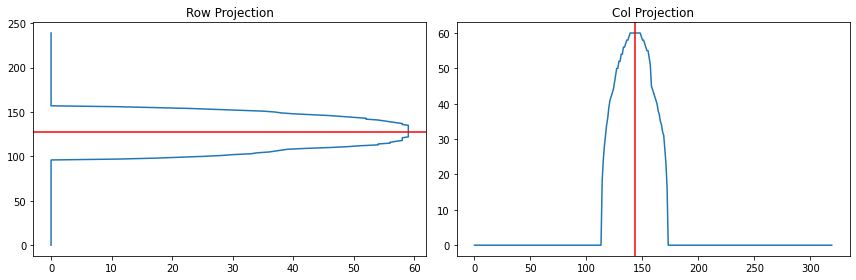

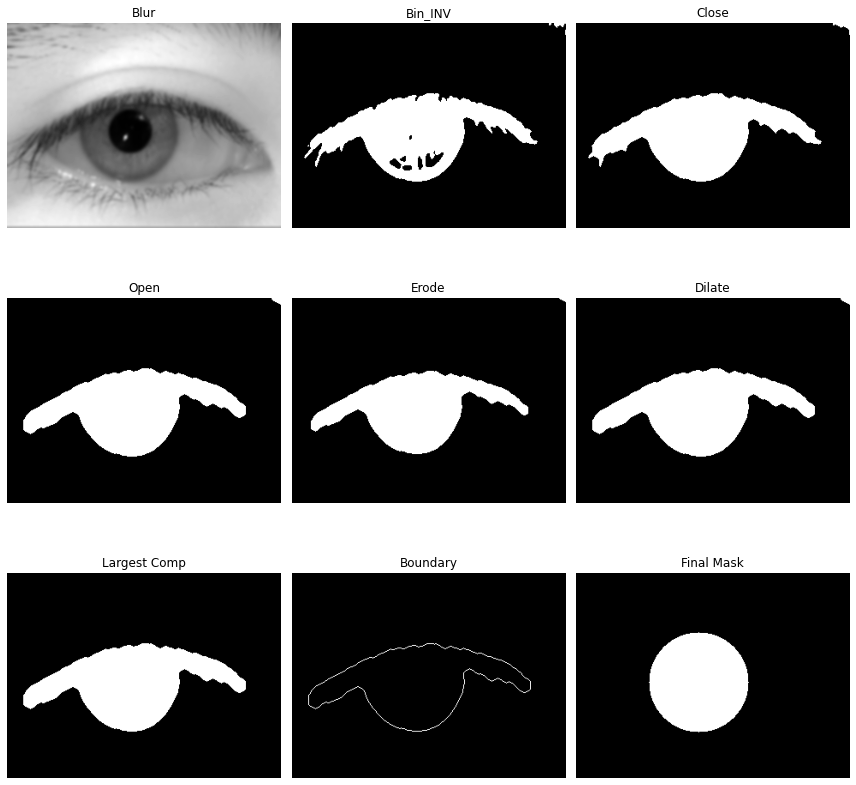

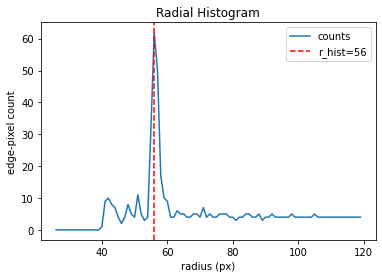

r_hist = 56, r_proj = 85, r_comb = 58


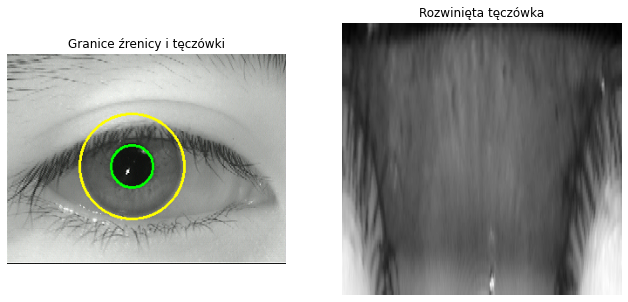

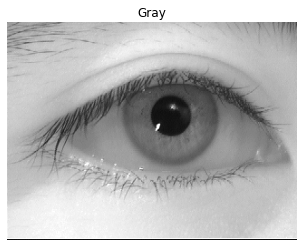

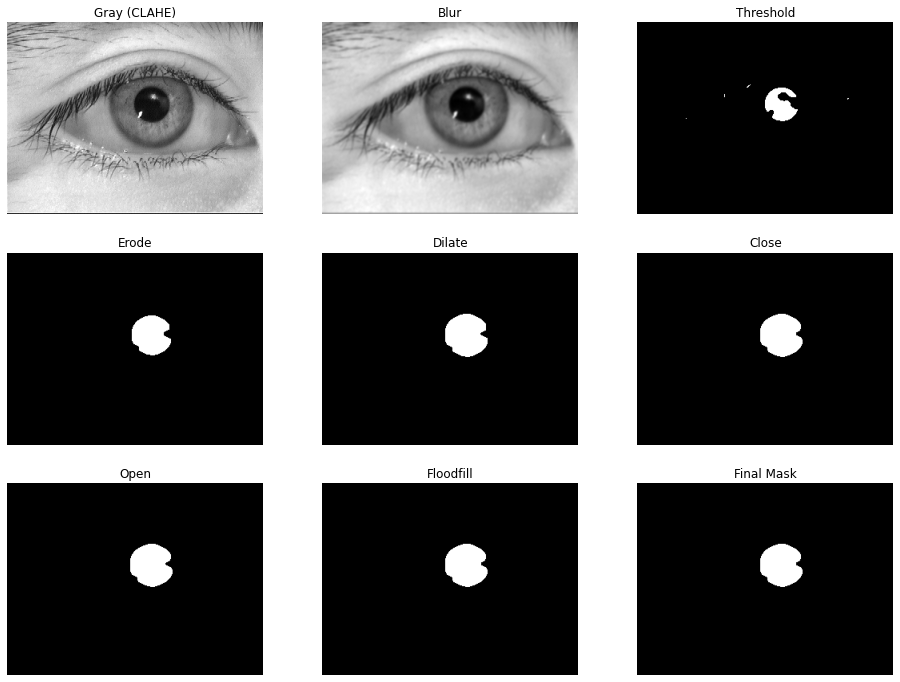

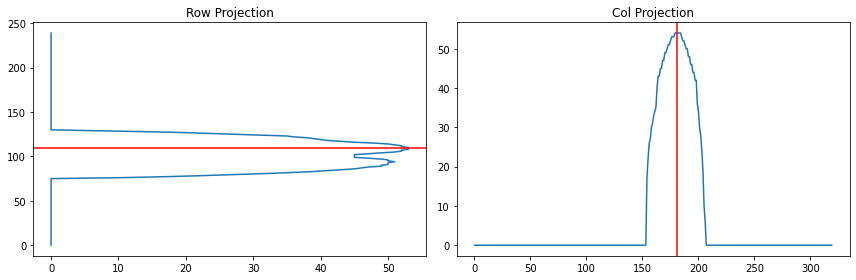

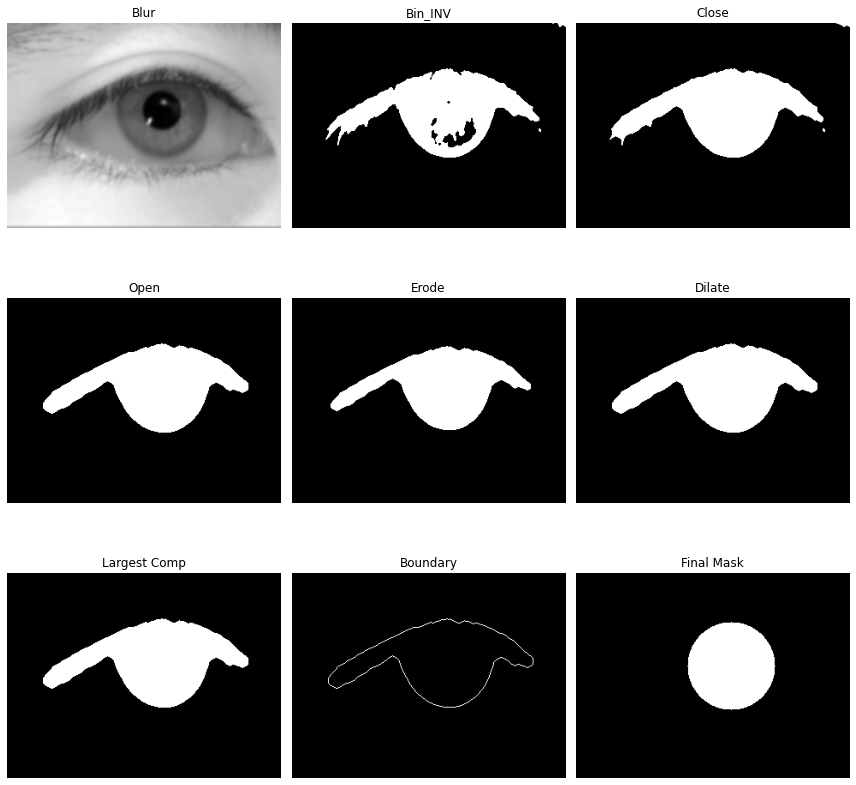

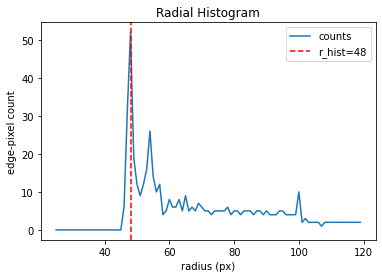

r_hist = 48, r_proj = 82, r_comb = 51


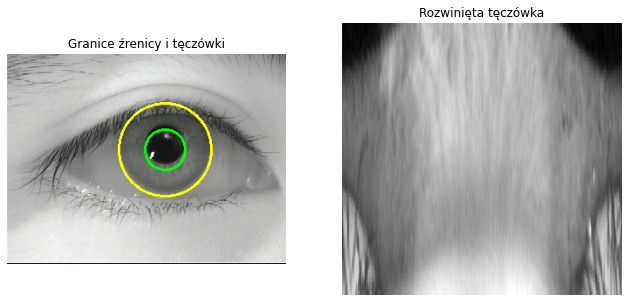

In [7]:
import matplotlib.pyplot as plt, sys, os
sample_paths = [
        './MMU-Iris-Database/40/left/tonghll1.bmp',
        './MMU-Iris-Database/42/left/weecml2.bmp',
        './MMU-Iris-Database/42/right/weecmr3.bmp',
        './MMU-Iris-Database/43/left/winl1.bmp',
        './MMU-Iris-Database/34/right/sitir1.bmp',
        './MMU-Iris-Database/34/right/sitir2.bmp',
        './MMU-Iris-Database/34/right/sitir3.bmp',
        './MMU-Iris-Database/34/right/sitir4.bmp',
        './MMU-Iris-Database/34/right/sitir5.bmp'
    
    ]
for img_path in sample_paths:
    img = cv.imread(img_path)  # BGR by default
    if img is None:
        raise FileNotFoundError(img_path)

    # ---------- szybka pojedyncza detekcja ----------
    gray = to_gray(img)
    (cy, cx), r, mask = detect_pupil(
        img_path,
        gray,
        X_P=4.5,
        kernel_size=5,
        morph_iter=1,
        debug=True
    )
    vis = img.copy()
    output_dir = "pupil_detection"
    os.makedirs(output_dir, exist_ok=True)
    base = os.path.splitext(os.path.basename(img_path))[0]


    # przygotowanie obrazu do rysowania
    gray_bgr = cv.cvtColor(cv.imread(img_path, cv.IMREAD_GRAYSCALE),
                            cv.COLOR_GRAY2BGR)
    # rysujemy tylko źrenicę:
    cv.circle(gray_bgr, (cx, cy), r, (0,255,0), 2)

    # zapis
    out_name = f"{base}_pupil_detected.png"
    out_path = os.path.join(output_dir, out_name)
    cv.imwrite(out_path, gray_bgr)
    
    r_iris, iris_mask = detect_iris(img_path,gray, (cy,cx), r, X_I=1.5, kernel_size=7, morph_iter=2, debug=True)
    unwrapped = unwrap_iris(gray, (cy,cx), r, r_iris,
                        radial_res=64, angular_res=360)
    cv.circle(vis, (cx, cy), r, (0,255,0), 2)
    cv.circle(vis, (cx, cy), r_iris, (0, 255, 255), 2)
    cv.circle(gray_bgr, (cx, cy), r_iris, (0, 255, 255), 2)
    output_dir_2 ="iris_detection"
    os.makedirs(output_dir_2, exist_ok=True)
    out_name_2 = f"{base}_iris_detected.png"
    out_path_2 = os.path.join(output_dir_2, out_name_2)
    cv.imwrite(out_path_2, gray_bgr)

    output_dir_3 = "unwrapped_iris"
    os.makedirs(output_dir_3,exist_ok=True)
    unwrapped_path = os.path.join(output_dir_3, f"{base}_unwrapped.png")
    cv.imwrite(unwrapped_path, unwrapped)

    plt.figure(figsize=(11, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv.cvtColor(vis, cv.COLOR_BGR2RGB))
    plt.axis("off"); plt.title("Granice źrenicy i tęczówki")
    plt.subplot(1, 2, 2)
    plt.imshow(unwrapped, cmap='gray', aspect='auto')
    plt.title('Rozwinięta tęczówka')
    plt.axis('off')
    plt.show()

# -------------------------------------------------------------
#  7.  Kodowanie tęczówki metodą Daugmana
# -------------------------------------------------------------

In [8]:
import matplotlib.pyplot as plt
def encode_iris(
    img_path: str,
    unwrapped:        np.ndarray,
    num_radial_bands: int   = 8,
    angular_points:   int   = 128,
    crop_top_frac:    float = 0.0,
    crop_bottom_frac: float = 0.0,
    gabor_freq:       float = 0.1,
    gabor_sigma:      float | None = None,
    radial_sigma:     float | None = None,
    debug:            bool  = False,
    output_dir:       str = "iris_code_debug"
) -> Tuple[np.ndarray, np.ndarray]:
    """
    Koduje „rozprostowaną” (rubber-sheet) tęczówkę do binarnego
    kodu Daugmana (2 bity na punkt) oraz maski jakościowej.

    Parametry
    ----------
    unwrapped : ndarray
        Obraz (radial_res × angular_res) zwrócony przez `unwrap_iris`.
    num_radial_bands : int, default 8
        Liczba współśrodkowych pasów (zgodnie z algorytmem Daugmana).
    angular_points : int, default 128
        Rozdzielczość kątowa kodu (128 punktów = 256 bitów na pas).
    crop_top_frac, crop_bottom_frac : float
        Części obrazu odcinane od góry/dół, aby pominąć powiekę i rzęsy
        **Uwaga 3 – pasy mają zbliżoną wysokość, więc odejmujemy również dół**.
    gabor_freq : float
        Częstotliwość falki Gabora (dobierana eksperymentalnie, patrz Uwaga 4).
    gabor_sigma : float | None
        Szerokość gaussowskiej otoczki.  Jeżeli `None`, przyjmujemy
        **σ = ½·π·f** (ważna korekta z tekstu – _nie_ 1∕(2πf)!).
    debug : bool
        Jeżeli `True`, drukuje i rysuje diagnostyczne wykresy dla pierwszego pasa.

    Zwraca
    -------
    code : ndarray (num_radial_bands, angular_points, 2)  dtype=uint8
        Binarne 2-bitowe współczynniki (Re, Im >= 0) dla każdego punktu.
    mask : ndarray (num_radial_bands, angular_points)  dtype=bool
        Maska z wartością False tam, gdzie odpowiedź falki była zbyt słaba.

    """
    os.makedirs(output_dir, exist_ok=True)
    base = os.path.splitext(os.path.basename(img_path))[0]

    radial_res, angular_res = unwrapped.shape

    # ------------------------- 1. Przygotowanie pasów radialnych --------------------------
    top_crop    = int(radial_res * crop_top_frac)
    bottom_crop = int(radial_res * crop_bottom_frac)
    valid_rows  = radial_res - top_crop - bottom_crop
    band_height = valid_rows // num_radial_bands

    if debug:
        import matplotlib.pyplot as plt
        fig, ax = plt.subplots(figsize=(6,4))
        ax.imshow(unwrapped, cmap='gray', aspect='auto', interpolation='nearest')
        for b in range(num_radial_bands + 1):
            y = top_crop + b * band_height
            ax.axhline(y, color='r', linestyle='--')
        ax.set_title('Unwrapped iris with bands')
        ax.set_xlabel('Angle index')
        ax.set_ylabel('Radius index')
        fig.tight_layout()
        fig.savefig(os.path.join(output_dir, f"{base}_bands.png"))
        plt.close(fig)

    if valid_rows <= 0:
        raise ValueError("Zbyt duże wartości crop_top_frac / crop_bottom_frac.")

    if band_height < 2:
        raise ValueError("Za mały obraz lub zbyt wiele pasów – band_height < 2 px.")

    # ------------------------- 2. Parametry falki Gabora ---------------------------------
    if gabor_sigma is None:
        # UWAGA! σ = ½ π f  (zgodnie z komentarzem w podręczniku)
        gabor_sigma = 0.5 * np.pi * gabor_freq
    if radial_sigma is None:
        sigma_radial = band_height / 2.0
    else:
        sigma_radial = radial_sigma

    # Otoczka gaussowska dla uśredniania radialnego (wysokość = band_height)
    gauss_win = cv.getGaussianKernel(band_height, sigma_radial).flatten()

    # Jednowymiarowy kernel Gabora (długość = angular_points)
    L = angular_points
   
    # Kontener na wynik
    code_raw = np.zeros((num_radial_bands, L, 2), dtype=np.uint8)
   
    # Indeksy kątowe (128 równych samp.)
    angles_idx = np.round(
        np.linspace(0, angular_res - 1, L, endpoint=False)
    ).astype(int)

    # ------------------------- 3. Iteracja po pasach -------------------------------------
    for b in range(num_radial_bands):
        start = top_crop + b * band_height
        end   = start + band_height
        band  = unwrapped[start:end, :]                  # wycinek [wys.×θ]

        # ---- Uśrednienie w kierunku radialnym (silna korelacja „promienna”) ----
        #   (band.T) – kształt θ×wys,  gauss_win – wektor wys
        v = (band.T @ gauss_win) / gauss_win.sum()       # → kształt (θ,)
        v_samp = v[angles_idx]                           # 128-dł. wektor

        v_samp = (v - v.mean()) / (v.std()+1e-6)

        L = angular_points
        x = np.arange(L)
        resp = np.zeros(L, dtype=complex)
        for k in range(L):
        # okno Gaussa centrowane w x=k (σ = gabor_sigma)
            w_u = np.exp(-((x - k)**2) / (gabor_sigma**2))
            gabor_complex = np.exp(-1j * 2*np.pi * gabor_freq * x)
            resp[k] = np.sum(v_samp * w_u * gabor_complex)

        resp_re = resp.real
        resp_im = resp.imag

        # ---- Binarne zakodowanie: znak(Re), znak(Im) ----
        code_raw[b, :, 0] = (resp_re >= 0).astype(np.uint8)
        code_raw[b, :, 1] = (resp_im >= 0).astype(np.uint8)
        

        # ---- Debug (opcjonalnie) ----
        if debug and b == 0:
            import matplotlib.pyplot as plt
            print(f"[DEBUG] Band 0: v_samp ∈ [{v_samp.min():.1f}, {v_samp.max():.1f}]")
            print(f"[DEBUG] resp_re ∈ [{resp_re.min():.1f}, {resp_re.max():.1f}]")
            print(f"[DEBUG] resp_im ∈ [{resp_im.min():.1f}, {resp_im.max():.1f}]")
            plt.figure(figsize=(12, 4))
            plt.subplot(131); plt.plot(v_samp);  plt.title('v_samp')
            plt.subplot(132); plt.plot(resp_re); plt.title('resp_re')
            plt.subplot(133); plt.plot(resp_im); plt.title('resp_im')
            plt.tight_layout(); plt.show()
    code = np.empty((num_radial_bands, 2*L), dtype=np.uint8)
    code[:, 0::2] = code_raw[:, :, 0]
    code[:, 1::2] = code_raw[:, :, 1]

    # 6) Wizualizacja całego 2-kanałowego kodu iris, jeśli debug
    if debug:
        import matplotlib.pyplot as plt
        fig,ax=plt.subplots(figsize=(8, num_radial_bands * 0.5),tight_layout=True)
        ax.imshow(
        code,
        cmap='gray',
        aspect='auto',
        interpolation='nearest',  # <--- brak wygładzania
        vmin=0, vmax=1             # <--- jasne określenie skali 0–1
        )
        ax.set_title('Binarny kod tęczówki (Re,Im naprzemiennie)')
        ax.set_xlabel('Bit index (0 … {} )'.format(2*L-1))
        ax.set_ylabel('Band')
        ax.set_xticks([0, L, 2*L-1], ['Re₀','Re₆₄','Im₁₂₇'])
        ax.set_yticks(range(num_radial_bands))
        fig.tight_layout()
        fig.savefig(os.path.join(output_dir, f"{base}_code.png"))
        plt.close(fig)

    return code_raw

# -------------------------------------------------------------
#  8.  Odległość Hamminga
# -------------------------------------------------------------

In [9]:
def hamming_distance(
     code1: Any,
     code2: Any
 ) -> float:
    """
    Oblicza odległość Hamminga między dwoma kodami Daugmana,
    porównując oddzielnie bity rzeczywiste (Re) i urojone (Im).
    Jeśli podano (code, mask), weźmie tylko kod.
    Zwraca odsetek różnych bitów w obu kanałach.
    """
    # Jeżeli dostaliśmy (code, mask), to wyciągamy tylko kod
    if isinstance(code1, tuple) or isinstance(code1, list):
        code1 = code1[0]
    if isinstance(code2, tuple) or isinstance(code2, list):
        code2 = code2[0]

    # code1, code2 mają teraz shape = (bands, angles, 2)
    re1, im1 = code1[:, :, 0], code1[:, :, 1]
    re2, im2 = code2[:, :, 0], code2[:, :, 1]

    # Porównanie bitów
    diff_re = (re1 != re2)
    diff_im = (im1 != im2)

    # Zliczamy różnice
    num_diff = np.count_nonzero(diff_re) + np.count_nonzero(diff_im)

    # Łączna liczba bitów = 2 * bands * angles
    total_bits = 2 * code1.shape[0] * code1.shape[1]

    return num_diff / total_bits if total_bits > 0 else 1.0

# -------------------------------------------------------------
#  9.  Testy dla przykładowych zdjęć
# -------------------------------------------------------------

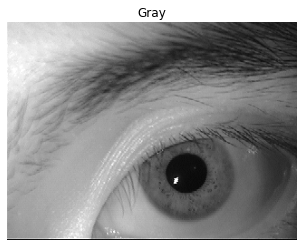

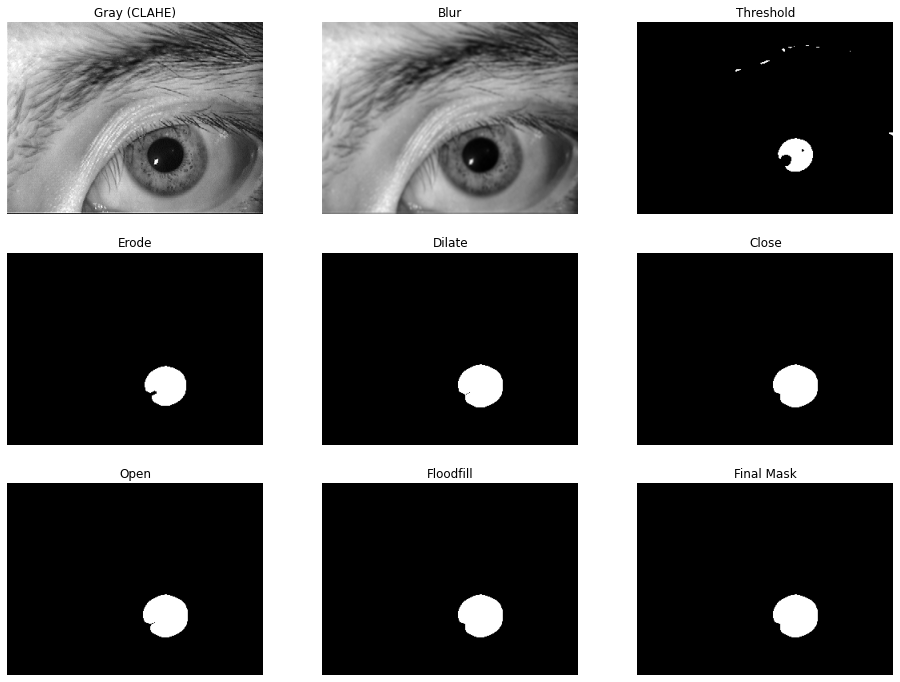

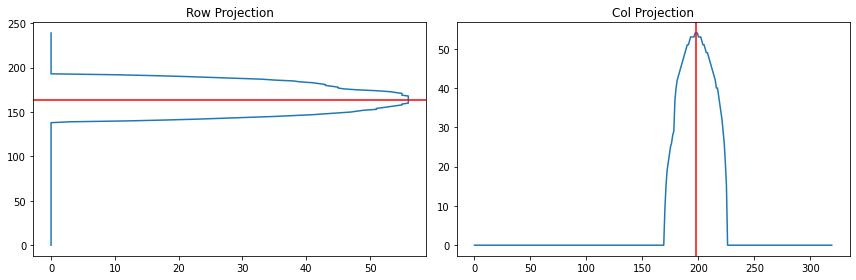

[DEBUG] Band 0: v_samp ∈ [-1.7, 3.3]
[DEBUG] resp_re ∈ [-0.7, 2.0]
[DEBUG] resp_im ∈ [-4.4, 1.7]


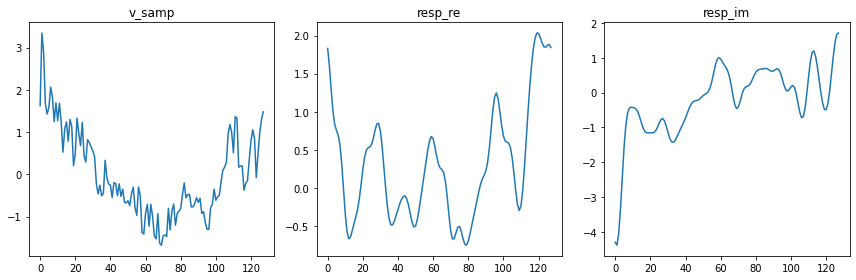

Zrobiono kod dla ./MMU-Iris-Database/40/left/tonghll1.bmp


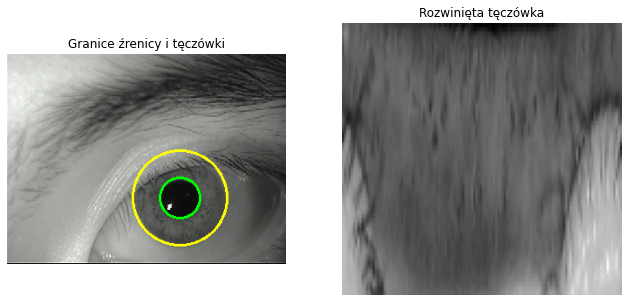

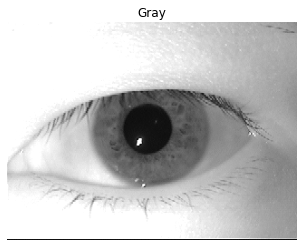

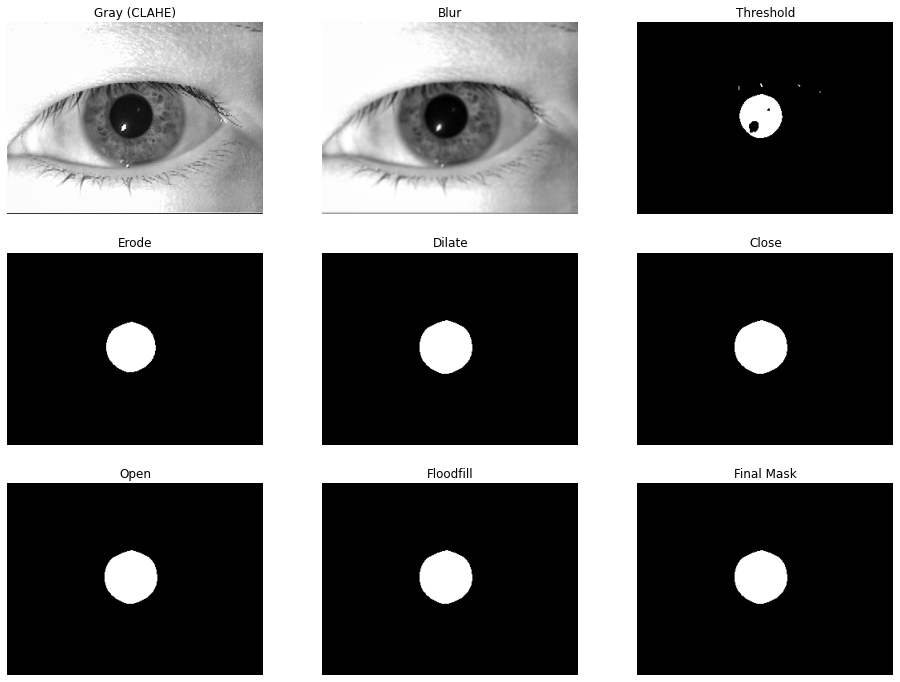

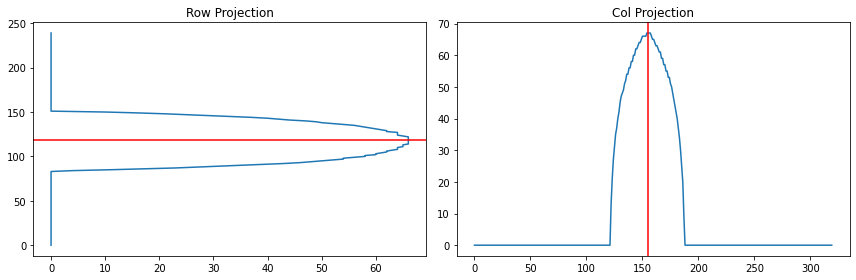

[DEBUG] Band 0: v_samp ∈ [-1.7, 2.0]
[DEBUG] resp_re ∈ [-1.0, 1.3]
[DEBUG] resp_im ∈ [-1.5, 2.1]


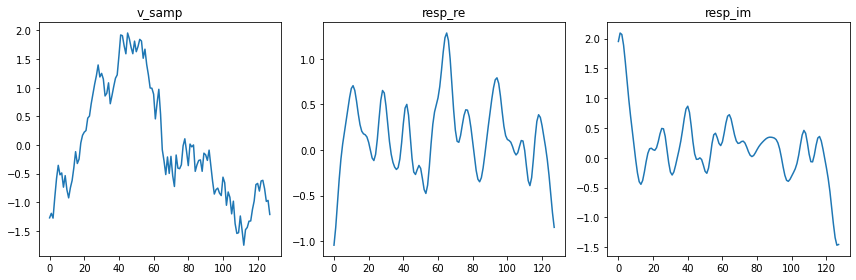

Zrobiono kod dla ./MMU-Iris-Database/42/left/weecml2.bmp


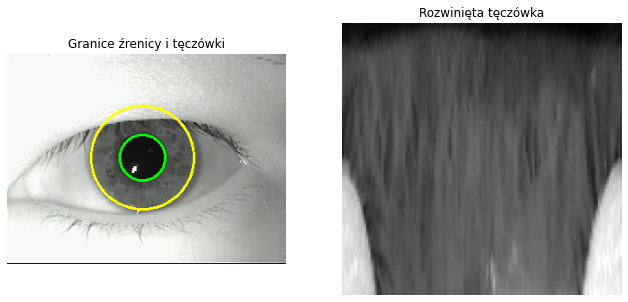

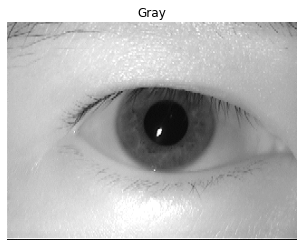

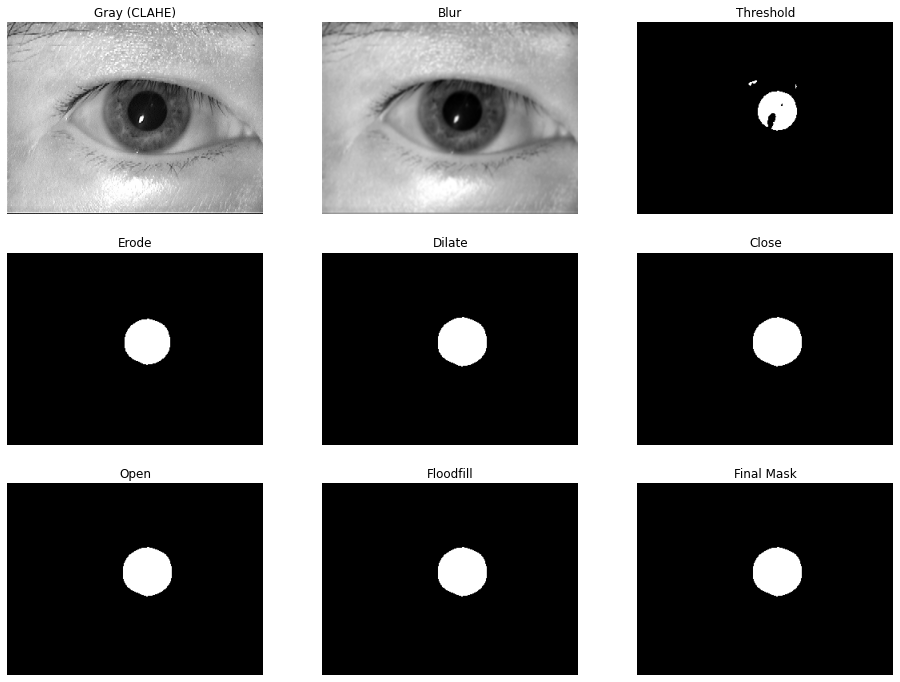

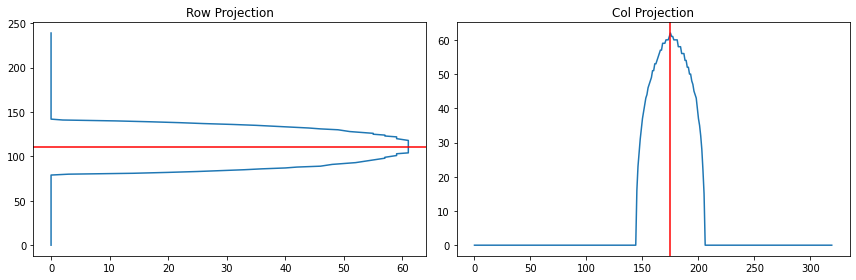

[DEBUG] Band 0: v_samp ∈ [-3.1, 1.5]
[DEBUG] resp_re ∈ [-2.2, 3.6]
[DEBUG] resp_im ∈ [-2.1, 1.7]


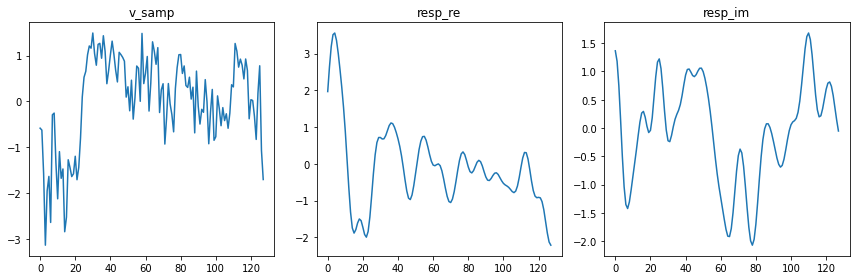

Zrobiono kod dla ./MMU-Iris-Database/42/right/weecmr3.bmp


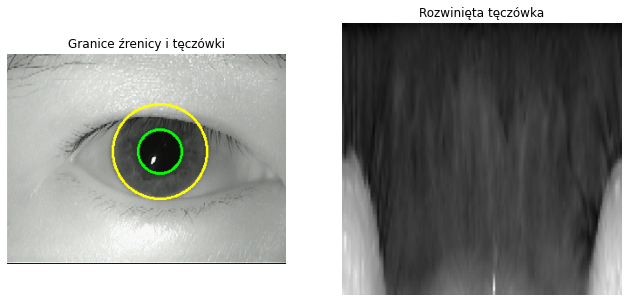

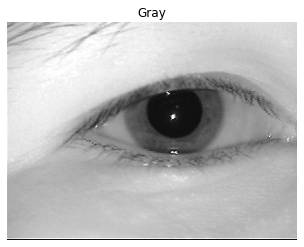

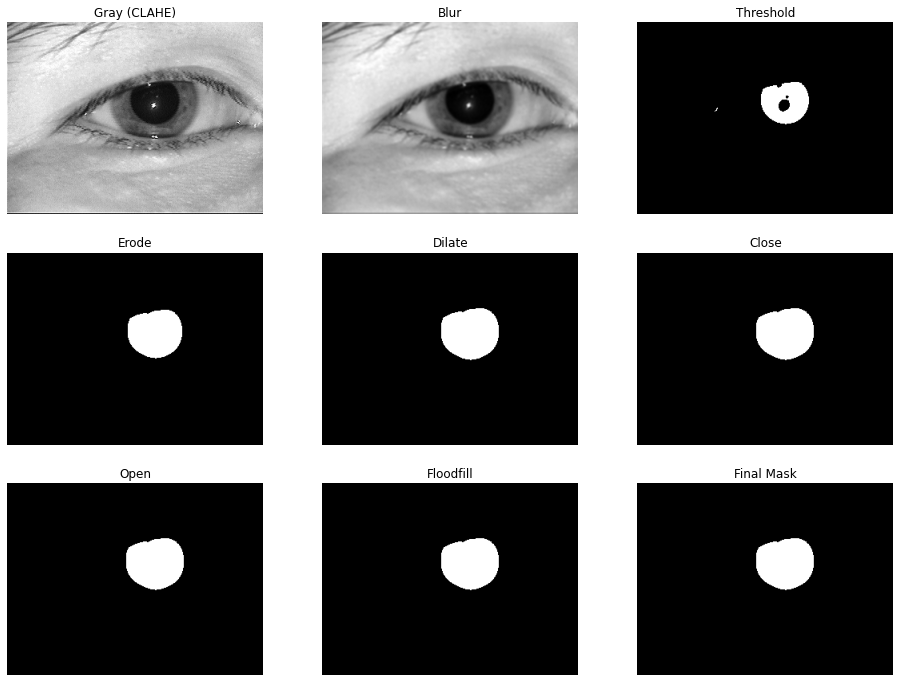

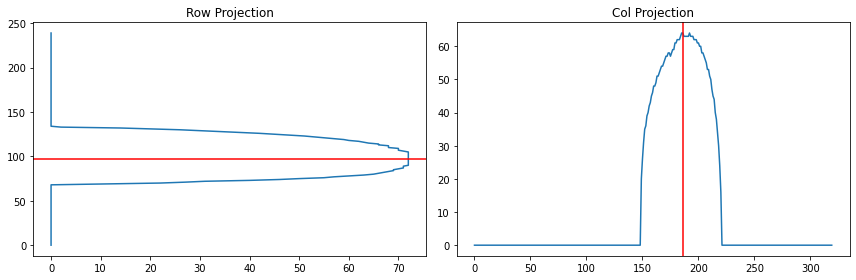

[DEBUG] Band 0: v_samp ∈ [-1.1, 2.5]
[DEBUG] resp_re ∈ [-1.6, 2.0]
[DEBUG] resp_im ∈ [-2.2, 3.9]


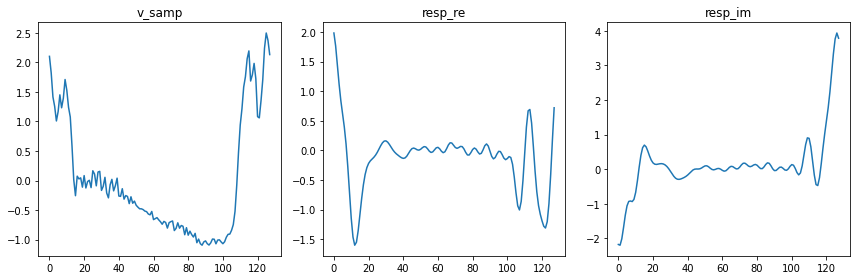

Zrobiono kod dla ./MMU-Iris-Database/43/left/winl1.bmp


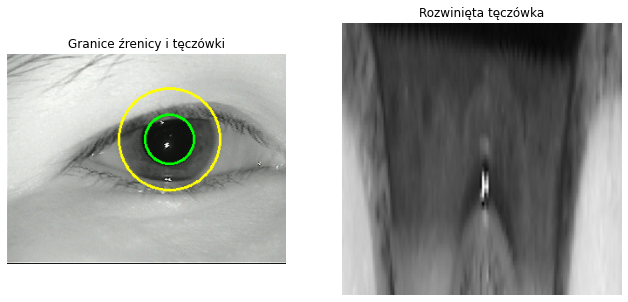

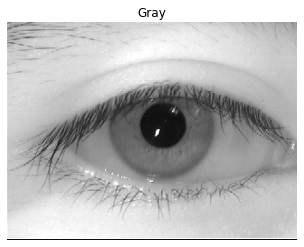

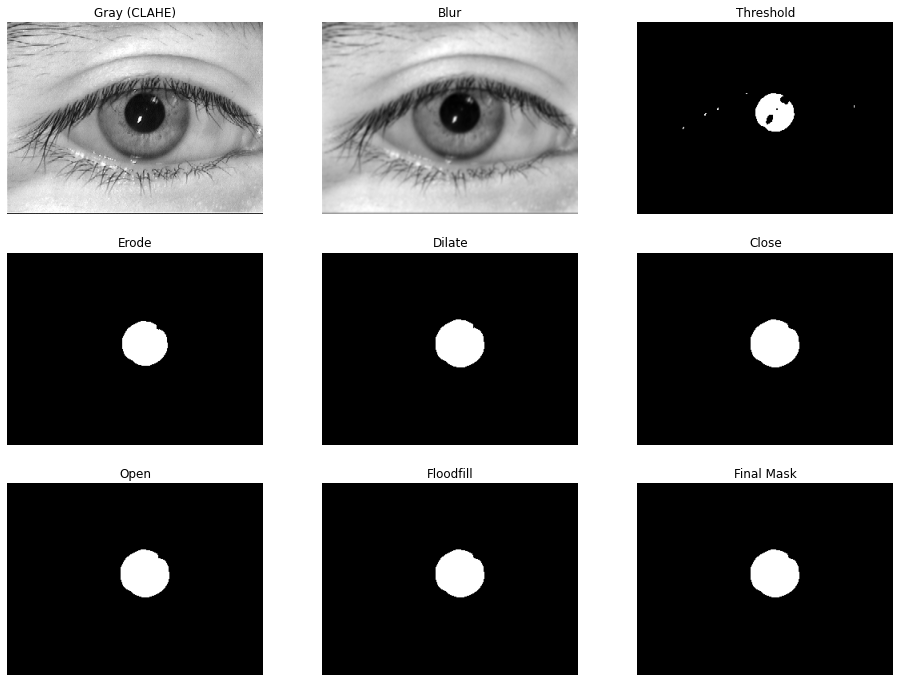

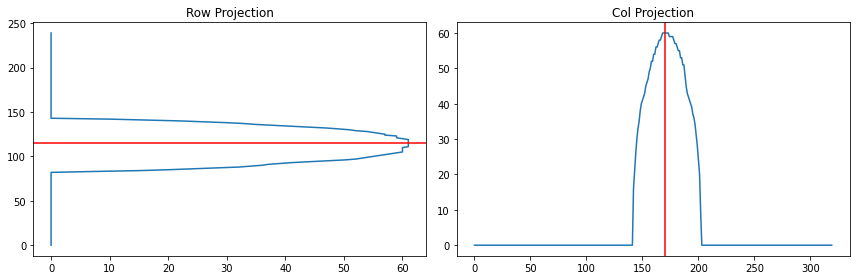

[DEBUG] Band 0: v_samp ∈ [-1.7, 2.1]
[DEBUG] resp_re ∈ [-0.9, 0.7]
[DEBUG] resp_im ∈ [-1.8, 1.7]


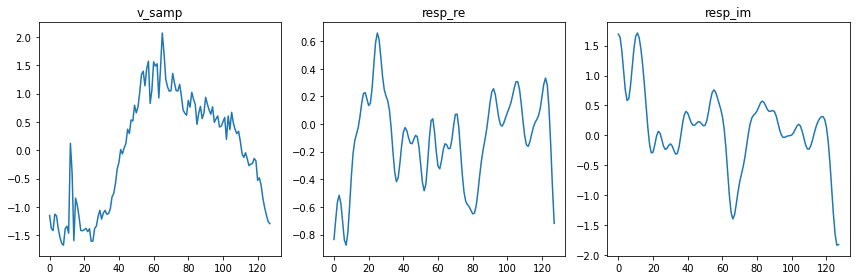

Zrobiono kod dla ./MMU-Iris-Database/34/right/sitir1.bmp


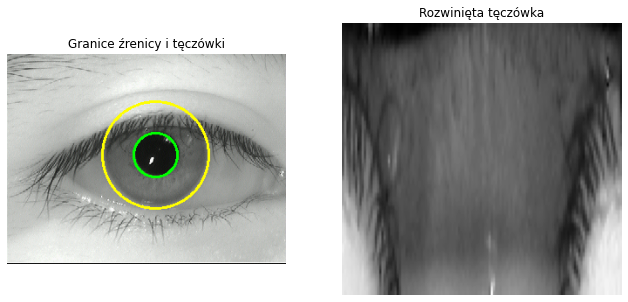

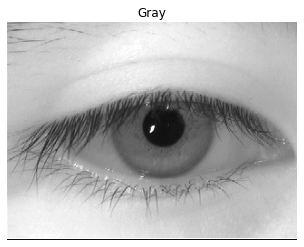

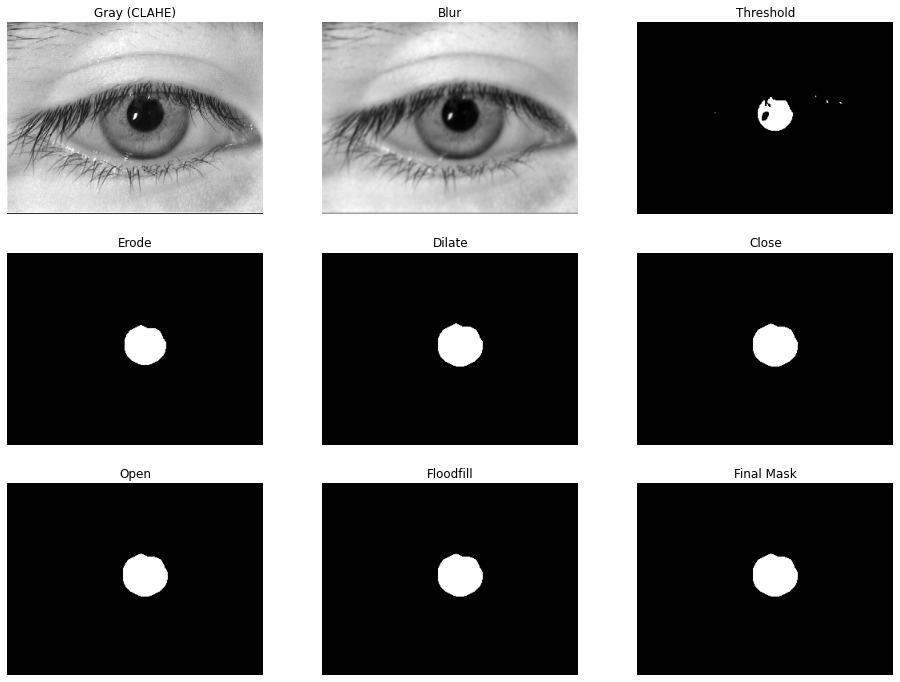

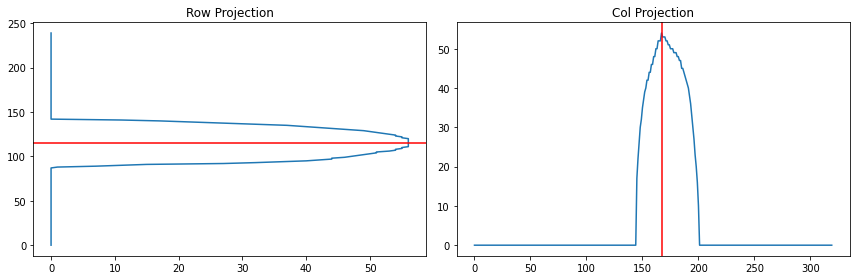

[DEBUG] Band 0: v_samp ∈ [-1.7, 2.6]
[DEBUG] resp_re ∈ [-1.0, 1.1]
[DEBUG] resp_im ∈ [-3.7, 2.6]


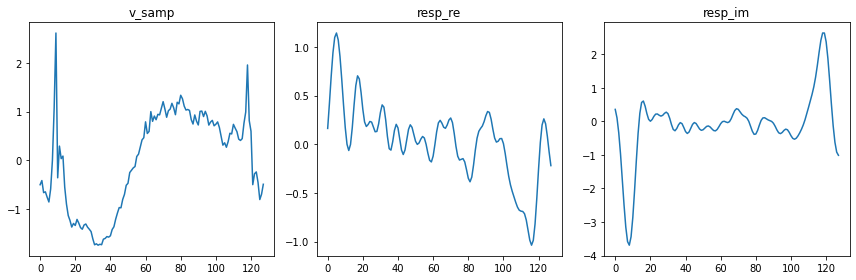

Zrobiono kod dla ./MMU-Iris-Database/34/right/sitir2.bmp


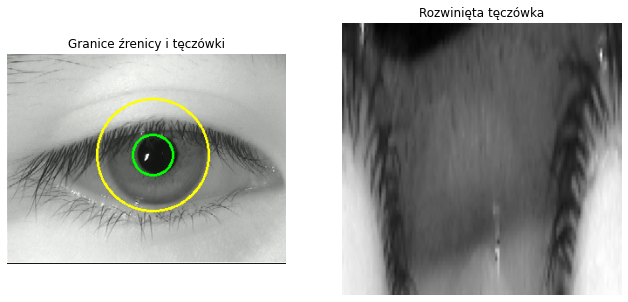

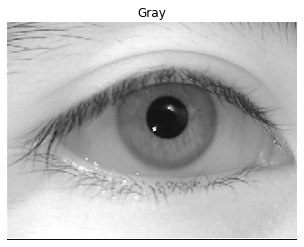

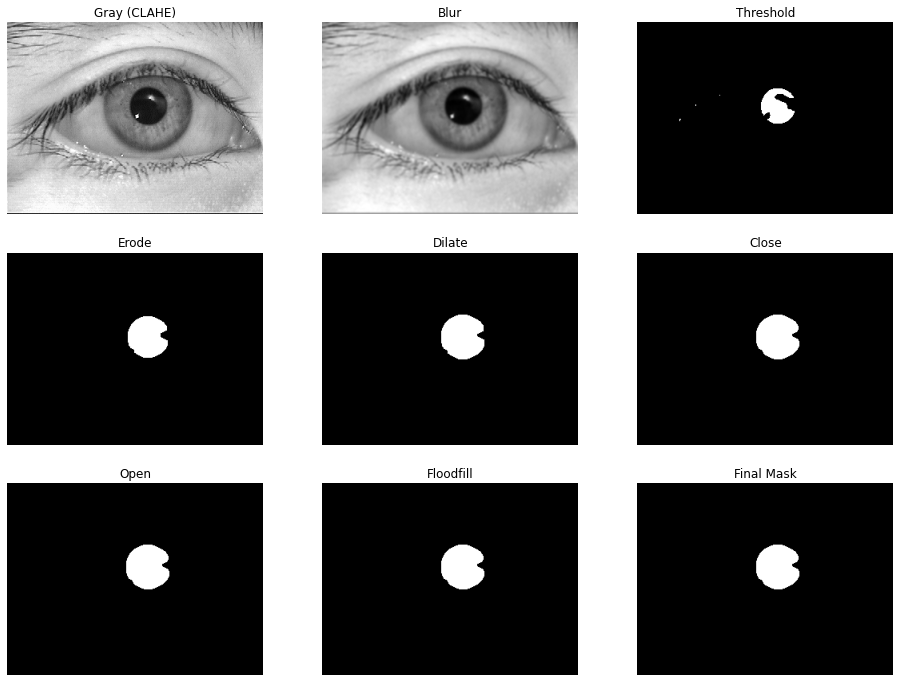

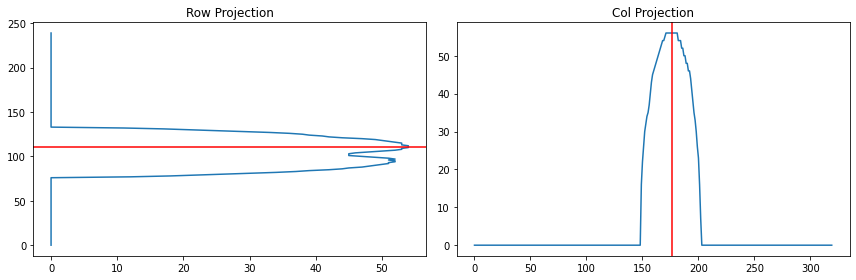

[DEBUG] Band 0: v_samp ∈ [-1.5, 1.2]
[DEBUG] resp_re ∈ [-0.7, 0.6]
[DEBUG] resp_im ∈ [-1.9, 1.8]


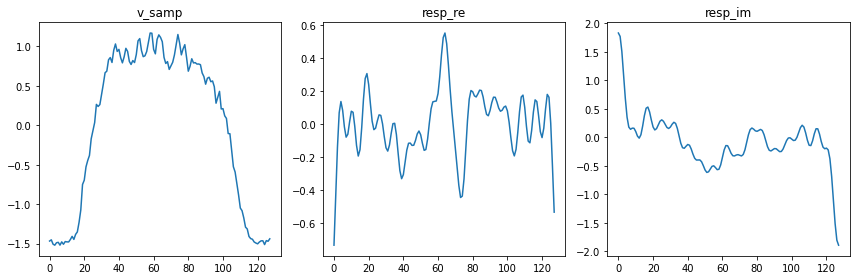

Zrobiono kod dla ./MMU-Iris-Database/34/right/sitir3.bmp


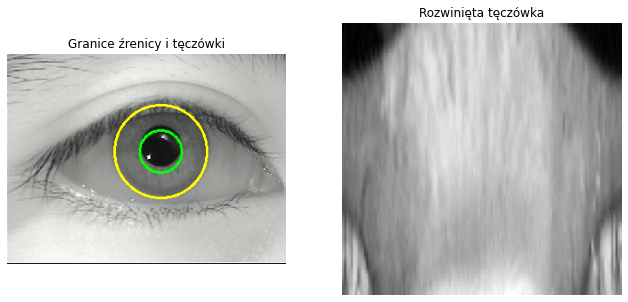

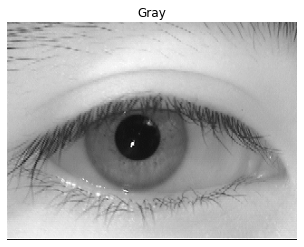

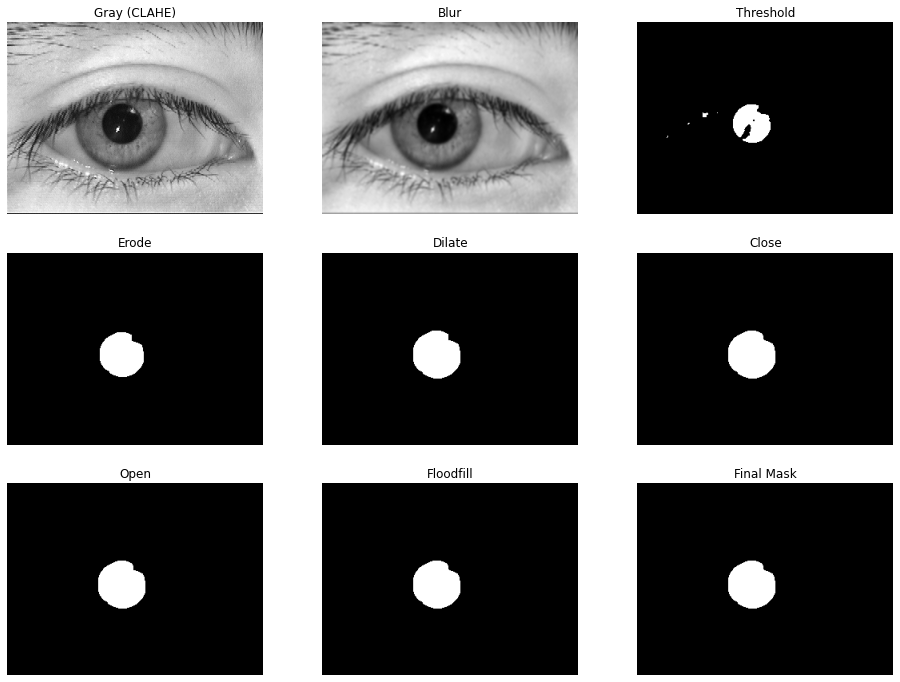

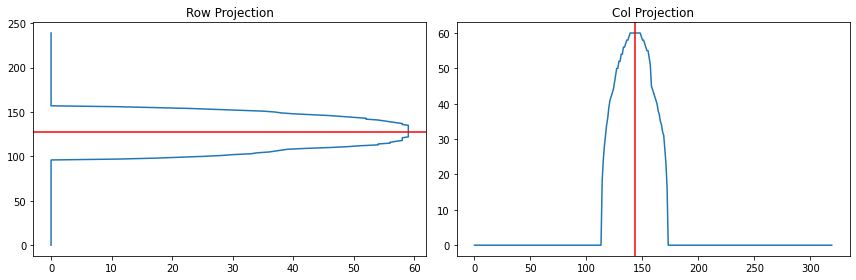

[DEBUG] Band 0: v_samp ∈ [-1.8, 2.1]
[DEBUG] resp_re ∈ [-1.6, 0.4]
[DEBUG] resp_im ∈ [-2.2, 2.0]


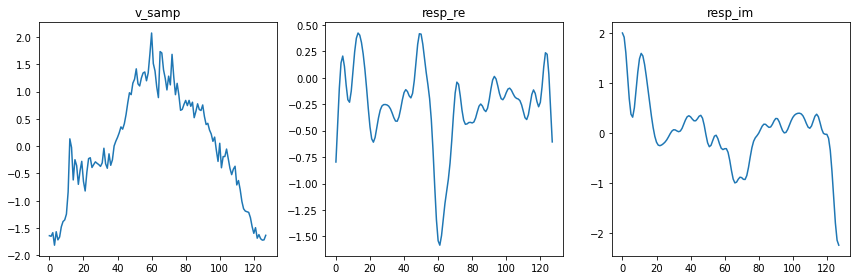

Zrobiono kod dla ./MMU-Iris-Database/34/right/sitir4.bmp


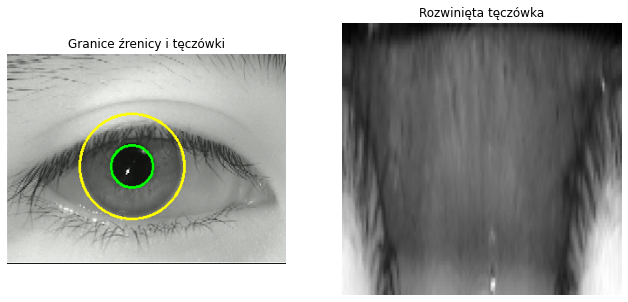

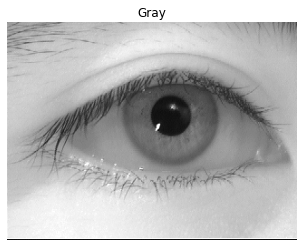

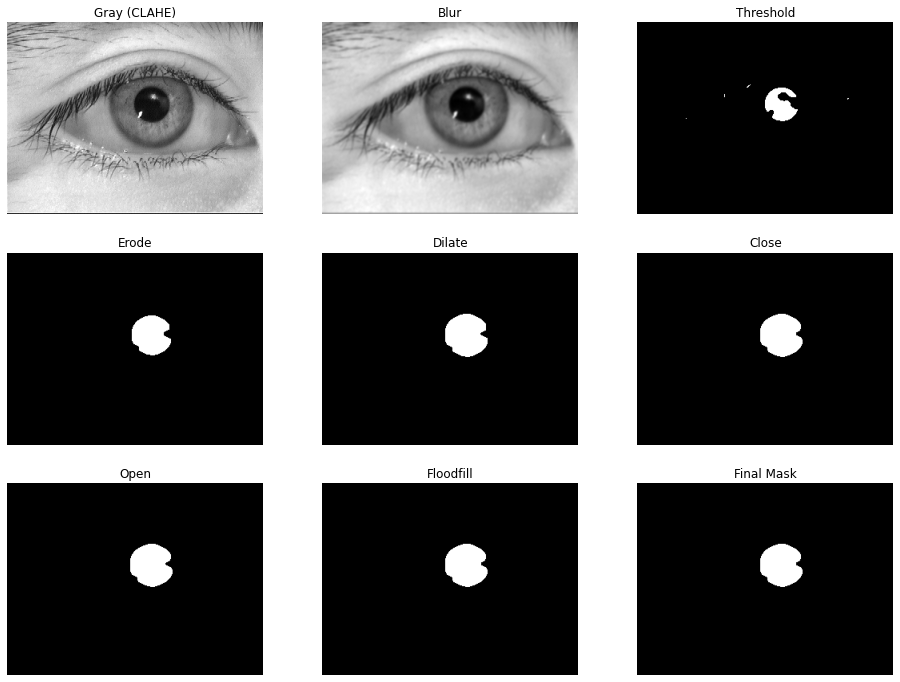

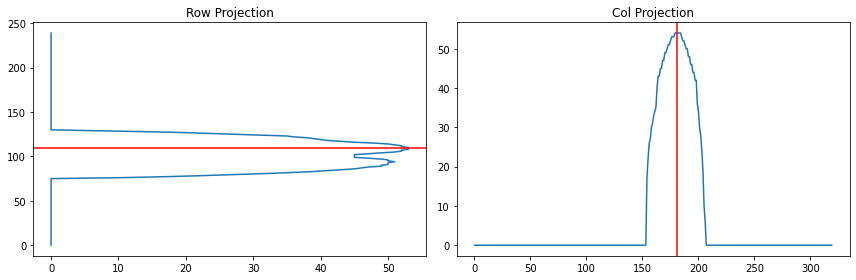

[DEBUG] Band 0: v_samp ∈ [-1.5, 1.2]
[DEBUG] resp_re ∈ [-0.8, 0.3]
[DEBUG] resp_im ∈ [-1.9, 1.9]


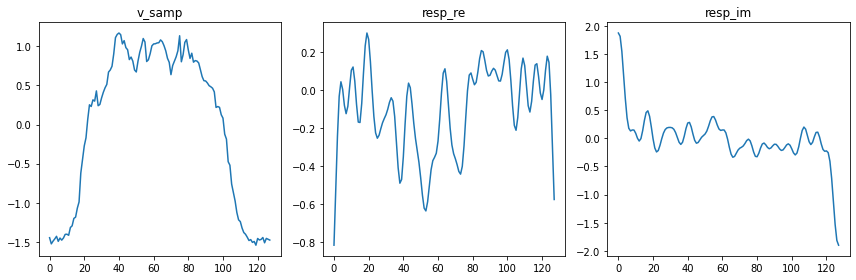

Zrobiono kod dla ./MMU-Iris-Database/34/right/sitir5.bmp


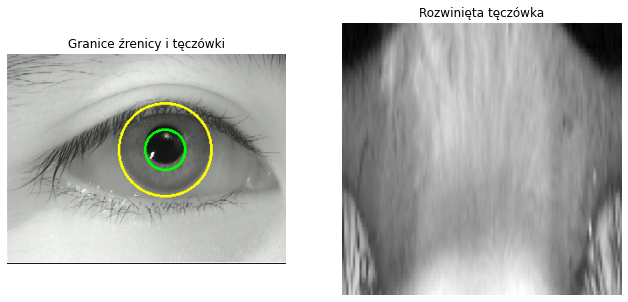


Macierz odległości Hamminga:
[[0.         0.45361328 0.5078125  0.50390625 0.44189453 0.45117188
  0.47070312 0.46191406 0.48876953]
 [0.45361328 0.         0.49658203 0.52587891 0.46191406 0.47119141
  0.47607422 0.49365234 0.47558594]
 [0.5078125  0.49658203 0.         0.44433594 0.49951172 0.49023438
  0.53710938 0.48242188 0.54931641]
 [0.50390625 0.52587891 0.44433594 0.         0.48095703 0.44921875
  0.57910156 0.49902344 0.56591797]
 [0.44189453 0.46191406 0.49951172 0.48095703 0.         0.45751953
  0.53857422 0.36865234 0.5078125 ]
 [0.45117188 0.47119141 0.49023438 0.44921875 0.45751953 0.
  0.51660156 0.42382812 0.50146484]
 [0.47070312 0.47607422 0.53710938 0.57910156 0.53857422 0.51660156
  0.         0.54394531 0.31005859]
 [0.46191406 0.49365234 0.48242188 0.49902344 0.36865234 0.42382812
  0.54394531 0.         0.52880859]
 [0.48876953 0.47558594 0.54931641 0.56591797 0.5078125  0.50146484
  0.31005859 0.52880859 0.        ]]


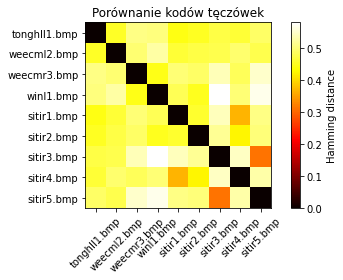

In [10]:
sample_paths = [
        './MMU-Iris-Database/40/left/tonghll1.bmp',
        './MMU-Iris-Database/42/left/weecml2.bmp',
        './MMU-Iris-Database/42/right/weecmr3.bmp',
        './MMU-Iris-Database/43/left/winl1.bmp',
        './MMU-Iris-Database/34/right/sitir1.bmp',
        './MMU-Iris-Database/34/right/sitir2.bmp',
        './MMU-Iris-Database/34/right/sitir3.bmp',
        './MMU-Iris-Database/34/right/sitir4.bmp',
        './MMU-Iris-Database/34/right/sitir5.bmp'
    
    ]

# Przechowaj zakodowane tęczówki
codes, masks = [], []

for path in sample_paths:
    img = cv.imread(path)
    gray = to_gray(img)
    (cy, cx), r_pupil, _ = detect_pupil(path,gray,
        X_P=4.5,
        kernel_size=5,
        morph_iter=1,
        debug=True)
    r_iris, _ = detect_iris(path,gray, (cy,cx), r_pupil, X_I=1.5, kernel_size=7, morph_iter=2)
    vis = img.copy()
    cv.circle(vis, (cx, cy), r_pupil, (0, 255, 0), 2)
    cv.circle(vis, (cx, cy), r_iris, (0, 255, 255), 2)
    unw = unwrap_iris(gray, (cy,cx), r_pupil, r_iris)
    code = encode_iris(path,unw,gabor_freq=np.pi,debug=True)
    codes.append(code)
    print(f'Zrobiono kod dla {path}')
    plt.figure(figsize=(11, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(cv.cvtColor(vis, cv.COLOR_BGR2RGB))
    plt.axis("off"); plt.title("Granice źrenicy i tęczówki")
    plt.subplot(1, 2, 2)
    plt.imshow(unw, cmap='gray', aspect='auto')
    plt.title('Rozwinięta tęczówka')
    plt.axis('off')
    plt.show()

# Porównaj Hamminga między każdą parą
n = len(codes)
print('\nMacierz odległości Hamminga:')
D = np.zeros((n,n))
for i in range(n):
    for j in range(n):
        D[i,j] = hamming_distance(codes[i], codes[j])
print(D)
# Wyświetlenie macierzy jako obraz
plt.imshow(D, cmap='hot', interpolation='nearest')
plt.colorbar(label='Hamming distance')
plt.title('Porównanie kodów tęczówek')
plt.xticks(range(n), [p.split('/')[-1] for p in sample_paths], rotation=45)
plt.yticks(range(n), [p.split('/')[-1] for p in sample_paths])
plt.tight_layout()
plt.show()


# -------------------------------------------------------------
#  10.  Skrypt zmieniający nazwy plików (wystarczy uruchomić tylko raz)
# -------------------------------------------------------------

In [ ]:
import os
import shutil

# Ścieżka do katalogu głównego z folderami numerowanymi (1,2,3,...)
root_dir = r'./MMU-Iris-Database'
# Ścieżka do katalogu docelowego
target_dir = r'./renamed_photos'

os.makedirs(target_dir, exist_ok=True)

# Przechodzimy przez każdy folder osoby
for person_folder in os.listdir(root_dir):
    person_path = os.path.join(root_dir, person_folder)
    if not os.path.isdir(person_path) or not person_folder.isdigit():
        continue  # pomijamy pliki lub niestandardowe katalogi

    # Dla left i right
    for eye_side in ('left', 'right'):
        side_path = os.path.join(person_path, eye_side)
        if not os.path.isdir(side_path):
            continue

        # Pobieramy wszystkie pliki w katalogu
        files = sorted(os.listdir(side_path))
        # Numerujemy od 1 wzwyż
        for idx, filename in enumerate(files, start=1):
            src = os.path.join(side_path, filename)
            # Zachowujemy rozszerzenie
            ext = os.path.splitext(filename)[1]
            # Tworzymy nową nazwę
            new_name = f"person_{person_folder}_{eye_side}_{idx}{ext}"
            dst = os.path.join(target_dir, new_name)
            # Kopiujemy plik
            shutil.copy2(src, dst)
            print(f"Copied: {src} -> {dst}")

print("Done copying and renaming all iris images.")

Copied: ./MMU-Iris-Database\1\left\Thumbs.db -> ./renamed_photos\person_1_left_1.db
Copied: ./MMU-Iris-Database\1\left\aeval1.bmp -> ./renamed_photos\person_1_left_2.bmp
Copied: ./MMU-Iris-Database\1\left\aeval2.bmp -> ./renamed_photos\person_1_left_3.bmp
Copied: ./MMU-Iris-Database\1\left\aeval3.bmp -> ./renamed_photos\person_1_left_4.bmp
Copied: ./MMU-Iris-Database\1\left\aeval4.bmp -> ./renamed_photos\person_1_left_5.bmp
Copied: ./MMU-Iris-Database\1\left\aeval5.bmp -> ./renamed_photos\person_1_left_6.bmp
Copied: ./MMU-Iris-Database\1\right\Thumbs.db -> ./renamed_photos\person_1_right_1.db
Copied: ./MMU-Iris-Database\1\right\aevar1.bmp -> ./renamed_photos\person_1_right_2.bmp
Copied: ./MMU-Iris-Database\1\right\aevar2.bmp -> ./renamed_photos\person_1_right_3.bmp
Copied: ./MMU-Iris-Database\1\right\aevar3.bmp -> ./renamed_photos\person_1_right_4.bmp
Copied: ./MMU-Iris-Database\1\right\aevar4.bmp -> ./renamed_photos\person_1_right_5.bmp
Copied: ./MMU-Iris-Database\1\right\aevar5.bmp -

# -------------------------------------------------------------
#  11.  Histogramy odległości Hamminga
# -------------------------------------------------------------

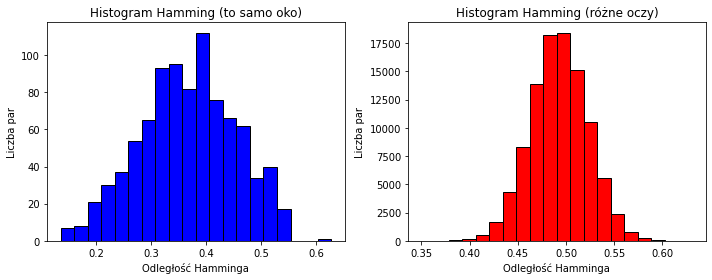

In [12]:
import os
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from itertools import combinations

# Katalog ze wszystkimi skopiowanymi plikami
target_dir = './renamed_photos'  # <-- dostosuj ścieżkę

# Wczytaj listę plików i ich metadane
images = []
for fname in sorted(os.listdir(target_dir)):
    if not fname.lower().endswith(('.bmp', '.png', '.jpg', '.jpeg')):
        continue
    person, pid, side, num_ext = fname.split('_')
    num, _ = os.path.splitext(num_ext)
    images.append({
        'path': os.path.join(target_dir, fname),
        'person': pid,
        'side': side,
        'num': int(num)
    })

# Zakodowane tęczówki
codes = []
for img_meta in images:
    img = cv.imread(img_meta['path'])
    gray = to_gray(img)
    (cy, cx), r_pupil, _ = detect_pupil(img_meta['path'],gray,X_P=4.5,kernel_size=5,morph_iter=1)
    r_iris, _ = detect_iris(img_meta['path'],gray, (cy, cx), r_pupil,X_I=1.5, kernel_size=7, morph_iter=2)
    unw = unwrap_iris(gray, (cy, cx), r_pupil, r_iris)
    code= encode_iris(img_meta['path'],unw, gabor_freq=np.pi,debug=False)
    codes.append(code)

# Oblicz odległości
same_eye = []
diff_eye = []

for (i, a), (j, b) in combinations(enumerate(images), 2):
    dist = hamming_distance(codes[i], codes[j])
    if a['person'] == b['person'] and a['side'] == b['side']:
        same_eye.append(dist)
    else:
        diff_eye.append(dist)

# Histogram for same eye distances
plt.figure(figsize=(10,4))
plt.subplot(1,2,1)
plt.hist(same_eye, bins=20, color='blue', edgecolor='black')
plt.title('Histogram Hamming (to samo oko)')
plt.xlabel('Odległość Hamminga')
plt.ylabel('Liczba par')

# Histogram for different eye distances
plt.subplot(1,2,2)
plt.hist(diff_eye, bins=20, color='red', edgecolor='black')
plt.title('Histogram Hamming (różne oczy)')
plt.xlabel('Odległość Hamminga')
plt.ylabel('Liczba par')

plt.tight_layout()
plt.show()

# -------------------------------------------------------------
#  12.  Statystyki histogramów
# -------------------------------------------------------------

c:\Users\jakub\anaconda3\lib\site-packages\pandas\core\computation\expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.8.1' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
c:\Users\jakub\anaconda3\lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.4' currently installed).
  from pandas.core import (


              mean       std       min       max   count
same_eye  0.367398  0.086521  0.135742  0.627441     900
diff_eye  0.492797  0.029624  0.350098  0.630859  100125

Threshold (same_eye) = mean + 3·std = 0.6270
Threshold (diff_eye) = mean - 3·std = 0.4039


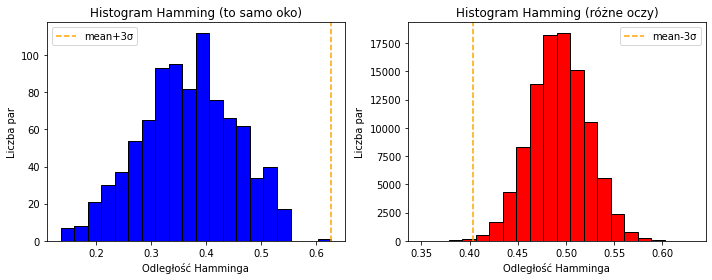

In [13]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Przyjmujemy, że masz już w pamięci listy same_eye i diff_eye

# Zamieniamy na numpy
same_eye = np.array(same_eye)
diff_eye = np.array(diff_eye)

# Obliczamy statystyki
stats = {
    'mean':   [same_eye.mean(),    diff_eye.mean()],
    'std':    [same_eye.std(ddof=0), diff_eye.std(ddof=0)],
    'min':    [same_eye.min(),     diff_eye.min()],
    'max':    [same_eye.max(),     diff_eye.max()],
    'count':  [same_eye.size,      diff_eye.size]
}
df = pd.DataFrame(stats, index=['same_eye', 'diff_eye'])
print(df)

# Progi na zasadzie dwóch sigm
threshold_same = df.loc['same_eye','mean'] + 3 * df.loc['same_eye','std']
threshold_diff = df.loc['diff_eye','mean'] - 3 * df.loc['diff_eye','std']
print(f"\nThreshold (same_eye) = mean + 3·std = {threshold_same:.4f}")
print(f"Threshold (diff_eye) = mean - 3·std = {threshold_diff:.4f}")

# Rysujemy histogramy z liniami progowymi
plt.figure(figsize=(10,4))

plt.subplot(1,2,1)
plt.hist(same_eye, bins=20, color='blue', edgecolor='black')
plt.axvline(threshold_same, color='orange', linestyle='--', label='mean+3σ')
plt.title('Histogram Hamming (to samo oko)')
plt.xlabel('Odległość Hamminga')
plt.ylabel('Liczba par')
plt.legend()

plt.subplot(1,2,2)
plt.hist(diff_eye, bins=20, color='red', edgecolor='black')
plt.axvline(threshold_diff, color='orange', linestyle='--', label='mean-3σ')
plt.title('Histogram Hamming (różne oczy)')
plt.xlabel('Odległość Hamminga')
plt.ylabel('Liczba par')
plt.legend()

plt.tight_layout()
plt.show()


# -------------------------------------------------------------
#  13.  Macierz konfuzji 
# -------------------------------------------------------------

Confusion Matrix (threshold = 0.374):

                      Predicted Same  Predicted Different
Actual Same Eye                  472                  428
Actual Different Eye               5               100120

Basic Classification Metrics:

Accuracy     0.995714
Precision    0.989518
Recall       0.524444
F1-score     0.685548
dtype: float64


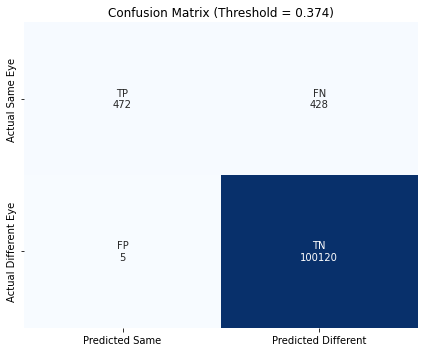

In [14]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Zakładamy ponownie, że same_eye i diff_eye to listy odległości
same_eye = np.array(same_eye)
diff_eye = np.array(diff_eye)

threshold = 0.374

# True Positives: te same oko zaklasyfikowane jako „to samo” (H < thresh)
TP = np.count_nonzero(same_eye < threshold)
# False Negatives: te same oko zaklasyfikowane błędnie jako „różne” (H >= thresh)
FN = np.count_nonzero(same_eye >= threshold)

# True Negatives: różne oczy zaklasyfikowane prawidłowo jako „różne” (H >= thresh)
TN = np.count_nonzero(diff_eye >= threshold)
# False Positives: różne oczy zaklasyfikowane błędnie jako „to samo” (H < thresh)
FP = np.count_nonzero(diff_eye < threshold)

# Podsumowanie
import pandas as pd

cm = pd.DataFrame(
    [[TP, FN],
     [FP, TN]],
    index=["Actual Same Eye", "Actual Different Eye"],
    columns=["Predicted Same", "Predicted Different"]
)

print("Confusion Matrix (threshold = 0.374):\n")
print(cm)

# Dodatkowe miary:
accuracy  = (TP + TN) / (TP + TN + FP + FN)
precision = TP / (TP + FP) if TP + FP > 0 else np.nan
recall    = TP / (TP + FN) if TP + FN > 0 else np.nan
f1_score  = 2 * precision * recall / (precision + recall) if precision + recall > 0 else np.nan

metrics = pd.Series({
    "Accuracy": accuracy,
    "Precision": precision,
    "Recall": recall,
    "F1-score": f1_score
})

print("\nBasic Classification Metrics:\n")
print(metrics)
conf_matrix = np.array([[TP, FN],
                        [FP, TN]])
labels = np.array([[f"TP\n{TP}", f"FN\n{FN}"],
                   [f"FP\n{FP}", f"TN\n{TN}"]])

# Rysuj
plt.figure(figsize=(6,5))
sns.heatmap(conf_matrix, annot=labels, fmt="", cmap="Blues", cbar=False,
            xticklabels=["Predicted Same", "Predicted Different"],
            yticklabels=["Actual Same Eye", "Actual Different Eye"])
plt.title("Confusion Matrix (Threshold = 0.374)")
plt.tight_layout()
plt.show()


# -------------------------------------------------------------
#  14. Wyniki różnych thresholdów
# -------------------------------------------------------------

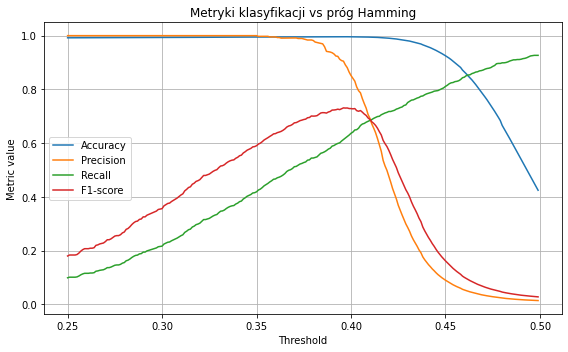

In [15]:
import numpy as np
import matplotlib.pyplot as plt

# Zakładamy, że same_eye i diff_eye już istnieją jako numpy.array
# same_eye = np.array(same_eye); diff_eye = np.array(diff_eye)

thresholds = np.arange(0.25, 0.5, 0.001)
accuracy_list, precision_list, recall_list, f1_list = [], [], [], []

for thr in thresholds:
    TP = np.count_nonzero(same_eye < thr)
    FN = np.count_nonzero(same_eye >= thr)
    FP = np.count_nonzero(diff_eye < thr)
    TN = np.count_nonzero(diff_eye >= thr)

    acc = (TP + TN) / (TP + TN + FP + FN)
    prec = TP / (TP + FP) if (TP + FP)>0 else 0
    rec = TP / (TP + FN) if (TP + FN)>0 else 0
    f1 = 2*prec*rec/(prec+rec) if (prec+rec)>0 else 0

    accuracy_list.append(acc)
    precision_list.append(prec)
    recall_list.append(rec)
    f1_list.append(f1)

plt.figure(figsize=(8,5))
plt.plot(thresholds, accuracy_list, label='Accuracy')
plt.plot(thresholds, precision_list, label='Precision')
plt.plot(thresholds, recall_list, label='Recall')
plt.plot(thresholds, f1_list, label='F1-score')
plt.xlabel('Threshold')
plt.ylabel('Metric value')
plt.title('Metryki klasyfikacji vs próg Hamming')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
